# Elección de características


In [143]:
import pandas as pd
df_pre = pd.read_csv('EDAdatos.csv', low_memory= False)
df_pre = df_pre[df_pre['mapped_highway'] != 'unclassified']
df_pre.columns

Index(['Unnamed: 0', 'index', 'num_expediente', 'fecha', 'hora',
       'localizacion', 'numero', 'cod_distrito', 'distrito', 'tipo_accidente',
       'estado_meteorológico', 'tipo_vehiculo', 'tipo_persona', 'rango_edad',
       'sexo', 'cod_lesividad', 'lesividad', 'coordenada_x_utm',
       'coordenada_y_utm', 'positiva_alcohol', 'positiva_droga', 'longitud',
       'latitud', 'osmid', 'oneway', 'lanes', 'name', 'highway', 'maxspeed',
       'reversed', 'length', 'geometry', 'junction', 'ref', 'tunnel', 'access',
       'bridge', 'width', 'est_width', 'u_v_k', 'edgedistance', 'nodedistance',
       'dia', 'mes', 'año', 'temperatura_media', 'precipitaciones(mm)',
       'velocidad_media_aire', 'ubi', 'mapped_highway', 'speed_limit',
       'speed_bin', 'lanes_filled'],
      dtype='object')

In [119]:
import pandas as pd
df = pd.read_csv('df_pre_clustering(colcompletabien).csv', low_memory= False)

In [35]:
df.columns

Index(['fecha', 'hora', 'coordenada_x_utm', 'coordenada_y_utm', 'latitud',
       'longitud', 'temperatura_media', 'precipitaciones(mm)',
       'velocidad_media_aire', 'oneway', 'lanes_filled', 'mapped_highway',
       'speed_limit', 'reversed', 'length', 'junction', 'tunnel', 'bridge',
       'edgedistance', 'nodedistance', 'close_to_intersection', 'day_of_week',
       'day_of_month', 'month', 'hour_sin', 'hour_cos',
       'time_of_day_Madrugada', 'time_of_day_Mañana', 'time_of_day_Noche',
       'time_of_day_Tarde', 'day_category', 'day_category_encoded',
       'month_sin', 'month_cos', 'season_fall', 'season_spring',
       'season_summer', 'season_winter', 'highway_Avenidas Principales',
       'highway_Calles Grandes', 'highway_Calles Pequeñas',
       'highway_Carreteras/Autopistas', 'highway_category', 'lanes_1',
       'lanes_2', 'lanes_3+', 'coordenada_x_utm_norm', 'coordenada_y_utm_norm',
       'temperatura_media_norm', 'precipitaciones(mm)_norm',
       'velocidad_media

In [2]:
df_clustering = df.drop(['fecha', 'hora','coordenada_x_utm', 'coordenada_y_utm', 'latitud', 'longitud', 'temperatura_media', 'precipitaciones(mm)', 'velocidad_media_aire', 'speed_limit',
                         'length',  'reversed', 'edgedistance', 'nodedistance', 'mapped_highway', 'lanes_filled',
                          'day_category', 'highway_category', 'day_of_week', 'day_of_month', 'time_of_day_Madrugada', 
                                'time_of_day_Mañana', 'time_of_day_Noche',
                                'time_of_day_Tarde', 'season_fall',
                                'season_spring', 'season_summer', 'season_winter', 'length', 'month'], axis=1)

In [3]:
df_clustering.columns

Index(['oneway', 'junction', 'tunnel', 'bridge', 'close_to_intersection',
       'hour_sin', 'hour_cos', 'day_category_encoded', 'month_sin',
       'month_cos', 'highway_Avenidas Principales', 'highway_Calles Grandes',
       'highway_Calles Pequeñas', 'highway_Carreteras/Autopistas', 'lanes_1',
       'lanes_2', 'lanes_3+', 'coordenada_x_utm_norm', 'coordenada_y_utm_norm',
       'temperatura_media_norm', 'precipitaciones(mm)_norm',
       'velocidad_media_aire_norm', 'length_norm', 'speed_limit_norm'],
      dtype='object')

In [4]:
pd.set_option("display.max_columns", None)
df_clustering.describe()

,oneway,junction,tunnel,bridge,close_to_intersection,hour_sin,hour_cos,day_category_encoded,month_sin,month_cos,highway_Avenidas Principales,highway_Calles Grandes,highway_Calles Pequeñas,highway_Carreteras/Autopistas,lanes_1,lanes_2,lanes_3+,coordenada_x_utm_norm,coordenada_y_utm_norm,temperatura_media_norm,precipitaciones(mm)_norm,velocidad_media_aire_norm,length_norm,speed_limit_norm
count,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,2.399350e+05,2.399350e+05,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000,239935.000000
mean,0.744535,0.026082,0.049051,0.039907,0.436868,-0.284993,-0.167542,0.250597,5.504680e-02,2.607848e-02,0.201284,0.268677,0.396762,0.133278,0.244262,0.352020,0.403718,0.493974,0.399853,0.518436,0.015643,0.237070,0.036421,0.325263
std,0.436123,0.159380,0.215975,0.195740,0.495999,0.661554,0.673096,0.433358,6.943898e-01,7.170193e-01,0.400960,0.443272,0.489227,0.339875,0.429650,0.477601,0.490643,0.130640,0.139252,0.201707,0.059200,0.128077,0.055496,0.139916
min,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,-0.866025,-0.866025,0.000000,-5.000000e-01,-8.660254e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.411140,0.290780,0.353261,0.000000,0.144330,0.011390,0.181818
50%,1.000000,0.000000,0.000000,0.000000,0.000000,-0.500000,-0.258819,0.000000,1.224647e-16,6.123234e-17,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.481987,0.403090,0.483696,0.000000,0.195876,0.021281,0.363636
75%,1.000000,0.000000,0.000000,0.000000,1.000000,0.258819,0.500000,1.000000,8.660254e-01,8.660254e-01,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.566706,0.496361,0.676630,0.001181,0.319588,0.039403,0.363636
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [148]:
def clasificar_vehiculos(df):
    # Lista de vehículos con 4 ruedas o más
    vehiculos_4_ruedas = [
        "Turismo", "Furgoneta", "Autobús", "Camión rígido", "Todo terreno",
        "Tractocamión", "Maquinaria de obras", "Autobús articulado", 
        "Vehículo articulado", "Autobus EMT", "Cuadriciclo ligero", 
        "Autocaravana", "Cuadriciclo no ligero", "Semiremolque", 
        "Camión de bomberos", "Remolque", "Autobús articulado EMT",
        "Maquinaria agrícola", "Microbús <= 17 plazas", "Tranvía"
    ]
    
    # Crear la nueva columna mapeando 1 o 0
    df['vehiculo_mas_4_ruedas'] = df['tipo_vehiculo'].apply(lambda x: 1 if x in vehiculos_4_ruedas else 0)
    
    return df
df['tipo_vehiculo'] = df_pre['tipo_vehiculo']
clasificar_vehiculos(df)

,fecha,hora,coordenada_x_utm,coordenada_y_utm,latitud,longitud,temperatura_media,precipitaciones(mm),velocidad_media_aire,oneway,...,velocidad_media_aire_norm,length_norm,speed_limit_norm,cluster_espacial,cluster_espacial_label,lesividad,time_20min,day_of_year,tipo_vehiculo,vehiculo_mas_4_ruedas
0,2019-02-04,2024-11-11 09:10:00,440068.049,4475679.170,40.429592,-3.706555,4.8,0.0,0.8,1,...,0.082474,0.023968,0.363636,1,Cluster 1,Asistencia sanitaria sólo en el lugar del acci...,2024-11-11 09:00:00,35,Motocicleta > 125cc,0
1,2019-02-04,2024-11-11 09:10:00,440068.049,4475679.170,40.429592,-3.706555,4.8,0.0,0.8,1,...,0.082474,0.023968,0.363636,1,Cluster 1,Asistencia sanitaria sólo en el lugar del acci...,2024-11-11 09:00:00,35,Turismo,1
2,2019-01-01,2024-11-11 03:45:00,439139.603,4470836.854,40.385903,-3.717037,6.6,0.0,0.3,1,...,0.030928,0.058602,0.363636,1,Cluster 1,NaN,2024-11-11 03:40:00,1,Furgoneta,1
3,2019-01-01,2024-11-11 03:45:00,439139.603,4470836.854,40.385903,-3.717037,6.6,0.0,0.3,1,...,0.030928,0.058602,0.363636,1,Cluster 1,NaN,2024-11-11 03:40:00,1,Turismo,1
4,2019-01-01,2024-11-11 03:45:00,439139.603,4470836.854,40.385903,-3.717037,6.6,0.0,0.3,1,...,0.030928,0.058602,0.363636,1,Cluster 1,NaN,2024-11-11 03:40:00,1,Turismo,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239930,2024-06-01,2024-11-11 03:28:00,442098.297,4476563.251,40.437700,-3.682702,19.8,0.0,2.8,1,...,0.288660,0.058978,0.727273,1,Cluster 1,NaN,2024-11-11 03:20:00,153,Turismo,1
239931,2024-05-17,2024-11-11 15:15:00,444081.453,4474613.298,40.420270,-3.659150,15.4,0.0,3.1,1,...,0.319588,0.058978,0.727273,0,Outlier,Sin asistencia sanitaria,2024-11-11 15:00:00,138,Turismo,1
239932,2024-05-17,2024-11-11 15:15:00,444081.453,4474613.298,40.420270,-3.659150,15.4,0.0,3.1,0,...,0.319588,0.050538,0.181818,0,Outlier,Sin asistencia sanitaria,2024-11-11 15:00:00,138,Turismo,1
239933,2024-06-03,2024-11-11 13:10:00,430309.750,4480528.867,40.472519,-3.822121,22.6,0.0,1.4,0,...,0.144330,0.050538,0.181818,0,Outlier,Asistencia sanitaria sólo en el lugar del acci...,2024-11-11 13:00:00,155,Camión rígido,1


# DBSCAN Componentes espaciales


In [120]:
import pandas as pd

# Agrupar los accidentes por coordenadas UTM y contar el número de accidentes en cada punto
#df_reducido = df_clustering[['coordenada_x_utm_norm', 'coordenada_y_utm_norm']].drop_duplicates().reset_index(drop=True)
#df_no_dupl = df.drop_duplicates(subset=['coordenada_x_utm_norm', 'coordenada_y_utm_norm']).reset_index(drop=True)
df_reducido = df[['coordenada_x_utm_norm', 'coordenada_y_utm_norm']].copy()


In [13]:
print(f"X_max = {df['coordenada_x_utm'].max()}")
print(f"X_min = {df['coordenada_x_utm'].min()}")
print(f"Y_max = {df['coordenada_y_utm'].max()}")
print(f"Y_min = {df['coordenada_y_utm'].min()}")

X_max = 455483.886
X_min = 429078.285
Y_max = 4491684.755
Y_min = 4463578.656


In [3]:
import numpy as np

epsilon_x_norm = 7/(df['coordenada_x_utm'].max()-df['coordenada_x_utm'].min())
epsilon_y_norm = 7/(df['coordenada_y_utm'].max()-df['coordenada_y_utm'].min())
epsilon_norm = np.mean([epsilon_x_norm, epsilon_y_norm])
print(f"Calculo 7m con x = {epsilon_x_norm}")
print(f"Calculo 7m con y = {epsilon_y_norm}")
print(f"Calculo 7m = {epsilon_norm}")


Calculo 7m con x = 0.00026509527277943773
Calculo 7m con y = 0.0002490562635533353
Calculo 7m = 0.0002570757681663865


In [20]:
df_clustering.columns

Index(['coordenada_x_utm', 'coordenada_y_utm', 'temperatura_media',
       'precipitaciones(mm)', 'velocidad_media_aire', 'oneway', 'speed_limit',
       'junction', 'tunnel', 'bridge', 'hour_sin', 'hour_cos',
       'day_category_encoded', 'month_sin', 'month_cos',
       'highway_Avenidas Principales', 'highway_Calles Grandes',
       'highway_Calles Pequeñas', 'highway_Carreteras/Autopistas', 'lanes_1',
       'lanes_2', 'lanes_3+', 'close_to_intersection'],
      dtype='object')

Gráfica del codo:

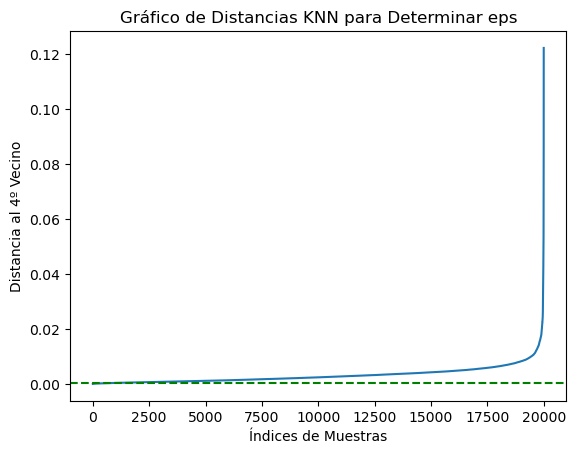

In [ ]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Encontrar el valor óptimo de 'eps' usando el gráfico de distancias KNN
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(df_reducido)
distances, indices = neighbors_fit.kneighbors(df_reducido)
distances = np.sort(distances[:, 4], axis=0)

# Graficar las distancias KNN para encontrar el "codo"
plt.plot(distances)
plt.xlabel('Índices de Muestras')
plt.ylabel('Distancia al 4º Vecino')
plt.axhline(y=0.0002570757681663865, color='g', linestyle='--', label='y = 0.00025')
plt.title('Gráfico de Distancias KNN para Determinar eps')
plt.show()


In [121]:
from sklearn.cluster import DBSCAN
import numpy as np
try:
    df_reducido = df_reducido.drop('cluster_label', axis=1)
    df_reducido = df_reducido.drop('cluster', axis=1)
except:
    pass

eps=0.0002570757681663865*1.5

db = DBSCAN(eps=eps, min_samples=5).fit(df_reducido)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_outliers = list(labels).count(-1)
print ("%6.3f, %d, %d" % (eps, n_clusters_, n_outliers))
df_reducido['cluster'] = labels
df['cluster_espacial'] = labels
print(df['cluster_espacial'].value_counts())

 0.000, 11479, 77559
cluster_espacial
-1        77559
 135       2056
 124       1153
 64         769
 263        721
          ...  
 10976        4
 10027        4
 7236         4
 8756         4
 9244         3
Name: count, Length: 11480, dtype: int64


In [122]:
import pandas as pd

# Supongamos que tu DataFrame se llama df_reducido
# Asegúrate de que las columnas necesarias existen
required_columns = ['cluster', 'coordenada_x_utm_norm', 'coordenada_y_utm_norm']
for col in required_columns:
    if col not in df_reducido.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# 1. Agrupar por 'cluster' y contar los pares únicos de coordenadas
# Utilizamos tuples para asegurar que ambos coordenadas se consideren juntas
unique_coords_per_cluster = df_reducido.groupby('cluster').apply(
    lambda x: x[['coordenada_x_utm_norm', 'coordenada_y_utm_norm']].drop_duplicates().shape[0]
)

# 2. Identificar los clusters con 5 o menos pares únicos de coordenadas
clusters_menos_5 = unique_coords_per_cluster[unique_coords_per_cluster <= 5].index

# Opcional: Mostrar los clusters identificados y su cantidad de pares únicos
print("Clusters con 5 o menos pares únicos de coordenadas:")
print(clusters_menos_5)
print(unique_coords_per_cluster[unique_coords_per_cluster <= 5])

# 3. Asignar -1 a los clusters identificados como outliers
df_reducido['cluster'] = df_reducido['cluster'].apply(
    lambda x: -1 if x in clusters_menos_5 else x
)
df['cluster_espacial'] = df_reducido['cluster']
# 4. Verificar la distribución final de los clusters
print("\nDistribución de clusters después de asignar outliers:")
print(df['cluster_espacial'].value_counts())


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\3590280795.py:12: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Clusters con 5 o menos pares únicos de coordenadas:
Index([    2,     3,     6,     8,    13,    14,    15,    17,    18,    19,
       ...
       11469, 11470, 11471, 11472, 11473, 11474, 11475, 11476, 11477, 11478],
      dtype='int64', name='cluster', length=8896)
cluster
2        4
3        5
6        2
8        1
13       5
        ..
11474    3
11475    1
11476    1
11477    1
11478    1
Length: 8896, dtype: int64

Distribución de clusters después de asignar outliers:
cluster_espacial
-1       143144
 135       2056
 124       1153
 64         769
 263        721
          ...  
 9026         7
 472          7
 5240         7
 303          6
 6712         6
Name: count, Length: 2584, dtype: int64


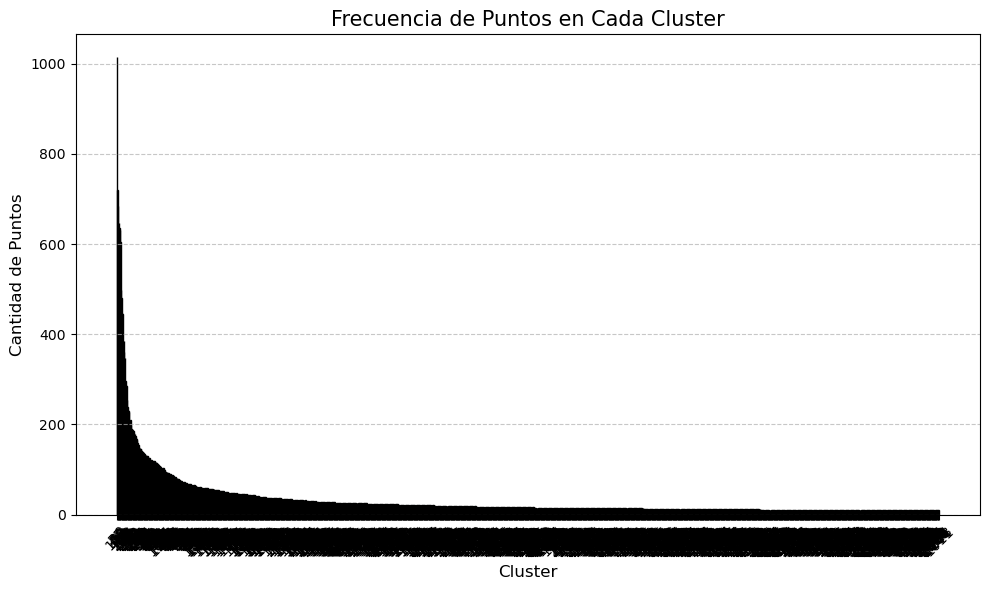

In [130]:
import matplotlib.pyplot as plt

# Calcular la cantidad de puntos en cada cluster
cluster_counts = df_reducido[df_reducido['cluster'] != -1]['cluster'].value_counts()

# Crear el histograma
plt.figure(figsize=(10, 6))
plt.bar(cluster_counts.index.astype(str), cluster_counts.values, color='skyblue', edgecolor='black')

# Configurar el título y etiquetas
plt.title('Frecuencia de Puntos en Cada Cluster', fontsize=15)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Cantidad de Puntos', fontsize=12)
plt.xticks(rotation=45)

# Añadir la grilla
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Mostrar la gráfica
plt.tight_layout()
plt.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Obtener los 10 clusters más grandes
cluster_counts = df_reducido['cluster'].value_counts()
top_clusters = cluster_counts.index[:10]  # Obtener los 10 clusters con más puntos

# Crear una nueva columna para diferenciar los clusters principales de los demás y etiquetar los outliers
def assign_cluster_label(cluster):
    if cluster == -1:
        return 'Outlier'
    elif cluster in top_clusters:
        return f'Cluster {cluster} (Top 10)'
    else:
        return f'Cluster {cluster}'

df_reducido['cluster_label'] = df_reducido['cluster'].apply(assign_cluster_label)

# Crear el scatter plot con Plotly, asignando el color negro para los outliers
fig = px.scatter(
    df_reducido,
    x='coordenada_x_utm',
    y='coordenada_y_utm',
    color='cluster_label',
    title='Mapa Interactivo de Accidentes de Tráfico por Cluster (Coordenadas Normalizadas)',
    labels={
        'coordenada_x_utm': 'Coordenada X (Normalizada)',
        'coordenada_y_utm': 'Coordenada Y (Normalizada)'
    },
    color_discrete_map={
        'Outlier': 'black',
        **{f'Cluster {cluster} (Top 10)': color for cluster, color in zip(top_clusters, px.colors.qualitative.Set1)},
        **{f'Cluster {cluster}': color for cluster, color in zip(cluster_counts.index[10:], px.colors.qualitative.Pastel1)}
    },
    opacity=0.6
)

# Ajustar el layout para mejorar la visualización
fig.update_layout(
    legend_title_text='Clusters',
    width=900,
    height=700
)
#df_reducido = df_reducido.drop('cluster_label', axis=1)
# Mostrar la gráfica
fig.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Cambiar los valores de cluster: 1 se mantiene, y los demás se asignan a 0 (incluyendo los outliers)
df_reducido['cluster'] = df_reducido['cluster'].apply(lambda x: 0 if x == -1 else 1)

# Asignar etiquetas para los clusters (1 o 0)
df_reducido['cluster_label'] = df_reducido['cluster'].apply(lambda x: 'Cluster 1' if x == 1 else 'Outlier')

# Crear el scatter plot con Plotly
fig = px.scatter(
    df_reducido,
    x='coordenada_x_utm_norm',
    y='coordenada_y_utm_norm',
    color='cluster_label',
    title='Mapa Interactivo de Accidentes de Tráfico por Cluster (Coordenadas Normalizadas)',
    labels={
        'coordenada_x_utm_norm': 'Coordenada X (Normalizada)',
        'coordenada_y_utm_norm': 'Coordenada Y (Normalizada)'
    },
    color_discrete_map={
        'Cluster 1': 'red',
        'Outlier': 'gray'
    },
    opacity=0.6
)

# Ajustar el layout para mejorar la visualización
fig.update_layout(
    legend_title_text='Clusters',
    width=900,
    height=700
)
df_reducido = df_reducido.drop('cluster_label', axis=1)
# Mostrar la gráfica
fig.show()


In [12]:
df_reducido.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102755 entries, 0 to 102754
Data columns (total 3 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   coordenada_x_utm  102755 non-null  float64
 1   coordenada_y_utm  102755 non-null  float64
 2   cluster           102755 non-null  int64  
dtypes: float64(2), int64(1)
memory usage: 2.4 MB


In [123]:
# EJECUTAR ESTE CODIGO
import plotly.express as px
import pandas as pd
import pyproj


# Cambiar los valores de cluster: 1 se mantiene, y los demás se asignan a 0 (incluyendo los outliers)
df_reducido['cluster'] = df_reducido['cluster'].apply(lambda x: 0 if x == -1 else 1)


df['cluster_espacial'] = df_reducido['cluster']
df['cluster_espacial_label'] = df['cluster_espacial'].apply(lambda x: 'Cluster 1' if x == 1 else 'Outlier')
# Asignar etiquetas para los clusters (1 o 0)

# Crear un objeto de proyección para convertir UTM a lat/long (EPSG:32630 es solo un ejemplo, asegúrate de usar la zona correcta)

fig = px.scatter_mapbox(
    df,
    lat='latitud',
    lon='longitud',
    color='cluster_espacial_label',
    title='Mapa Interactivo de Accidentes de Tráfico por Cluster',
    labels={
        'latitud': 'Latitud',
        'longitud': 'Longitud'
    },
    color_discrete_map={
        'Cluster 1': 'red',
        'Outlier': 'gray'
    },
    opacity=0.6,
    zoom=10,
    height=700
)

# Configurar el estilo de mapa
fig.update_layout(
    mapbox_style="open-street-map",  # Puedes cambiar a 'satellite-streets', 'carto-positron', etc.
    legend_title_text='Clusters',
    width=900,
)

# Guardar la figura como archivo HTML
fig.write_html('mapa_interactivo_accidentes_cluster_espacial.html')

# Mostrar la gráfica en el entorno actual
#fig.show()


In [98]:
df['cluster_espacial_label'].value_counts()

cluster_espacial_label
Outlier      239888
Cluster 1        47
Name: count, dtype: int64

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\2504177019.py:77: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

c:\Users\JUAMARIO\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



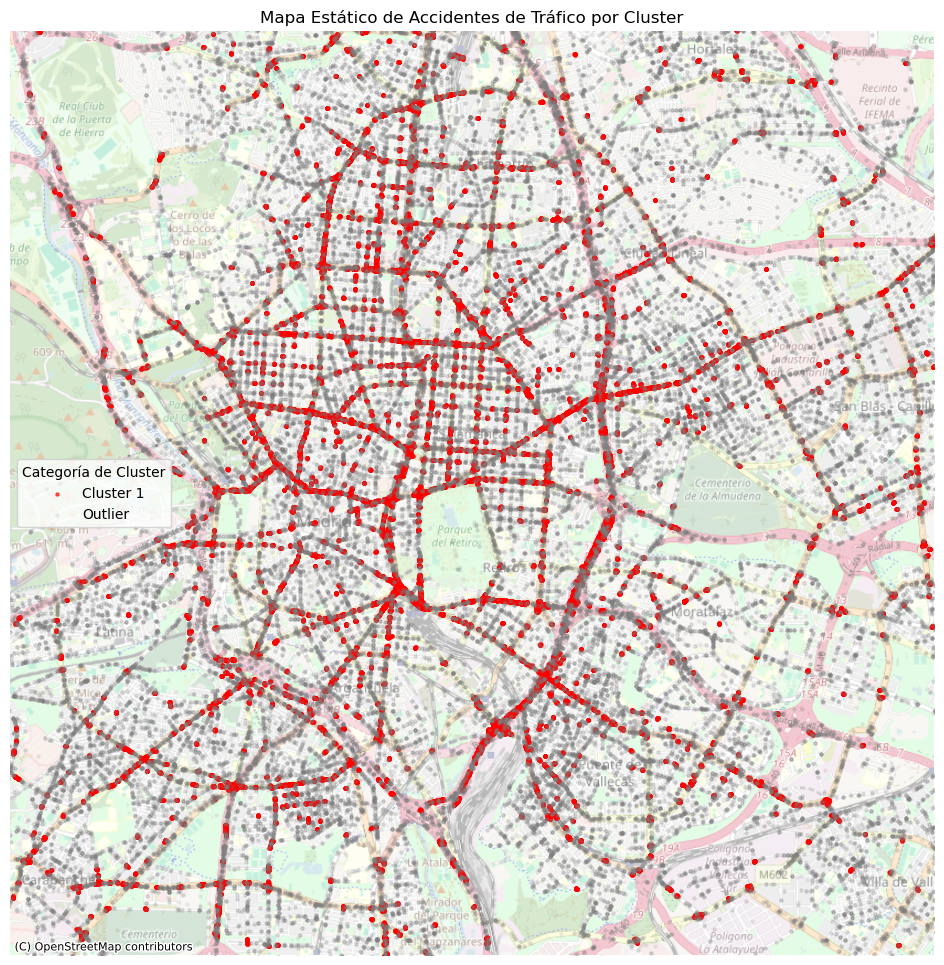

In [104]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as ctx

# Suponiendo que 'df' es tu DataFrame con las columnas 'latitud', 'longitud' y 'cluster_espacial_label'

# Crear una GeoDataFrame a partir del DataFrame original
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitud, df.latitud),
    crs="EPSG:4326"  # Sistema de referencia de coordenadas WGS84
)

# Reproyectar a Web Mercator para facilitar la superposición con mapas base
gdf = gdf.to_crs(epsg=3857)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(12, 12))

# Definir colores para cada categoría
colors = {
    'Cluster 1': 'red',
    'Outlier': 'gray'
}

# Graficar los puntos según su categoría con alphas diferentes
for category, color in colors.items():
    subset = gdf[gdf['cluster_espacial_label'] == category]
    # Establecer alpha según la categoría
    if category == 'Outlier':
        alpha_value = 0.1
    else:
        alpha_value = 0.6
    subset.plot(
        ax=ax,
        marker='o',
        color=color,
        markersize=5,
        label=category,
        alpha=alpha_value
    )

# Configurar límites de los ejes para enfocar la región de interés
# Obtener los límites actuales del mapa
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Ampliar los límites en un factor determinado
factorx = 0.8
factory = 8
new_xlim = [
    (xlim[1] + xlim[0]) / 2 - 10000 * factorx,
    (xlim[1] + xlim[0]) / 2 + 10000 * factorx
]
new_ylim = [
    (ylim[1] + ylim[0]) / 2 - 1500 * factory,
    (ylim[1] + ylim[0]) / 2 + 500 * factory
]

# Establecer los nuevos límites
ax.set_xlim(new_xlim)
ax.set_ylim(new_ylim)

# Añadir el mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

# Añadir leyenda y título
ax.legend(title='Categoría de Cluster')
ax.set_title('Mapa Estático de Accidentes de Tráfico por Cluster')

# Eliminar ejes para una mejor visualización
ax.set_axis_off()

# Guardar el mapa como imagen PNG
plt.savefig('mapa_estatico_accidentes.png', dpi=300, bbox_inches='tight')

# Mostrar el mapa
plt.show()


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_27472\621285183.py:69: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

c:\Users\JUAMARIO\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



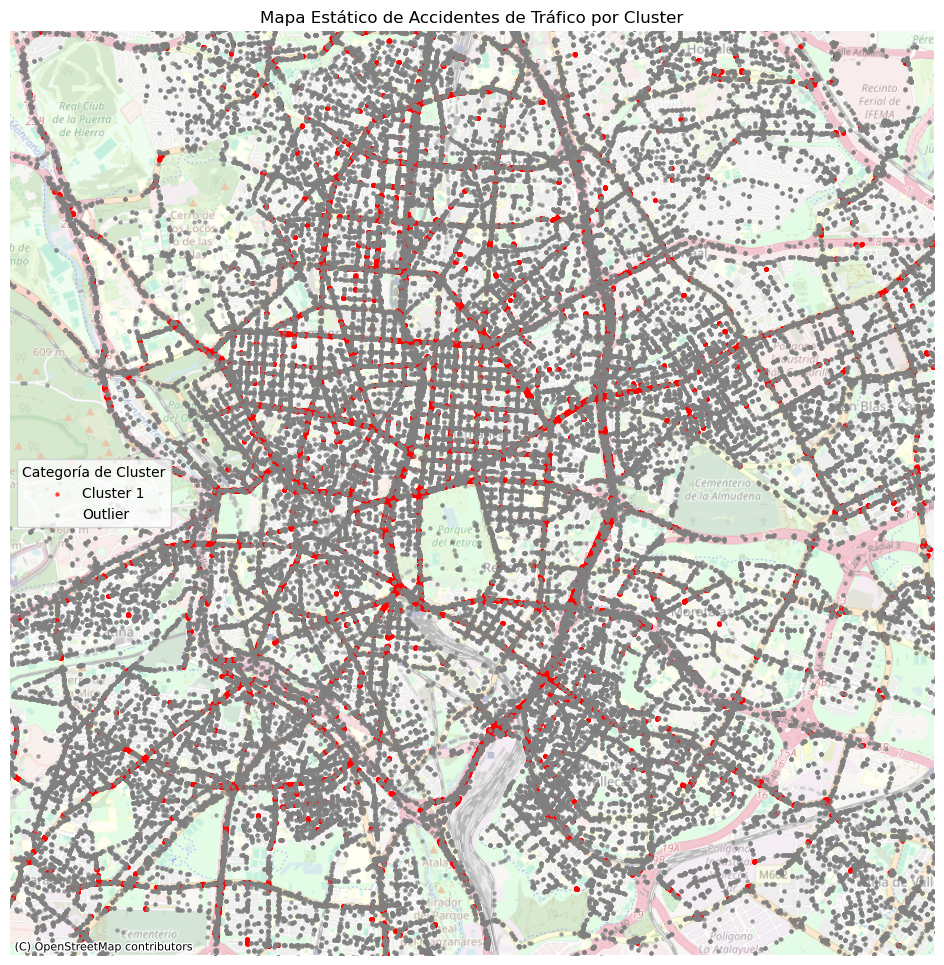

In [66]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as ctx

# Suponiendo que 'df' es tu DataFrame con las columnas 'latitud', 'longitud' y 'cluster_espacial_label'

# Crear una GeoDataFrame a partir del DataFrame original
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitud, df.latitud),
    crs="EPSG:4326"  # Sistema de referencia de coordenadas WGS84
)

# Reproyectar a Web Mercator para facilitar la superposición con mapas base
gdf = gdf.to_crs(epsg=3857)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(12, 12))

# Añadir un mapa base utilizando contextily

# Definir colores para cada categoría
colors = {
    'Cluster 1': 'red',
    'Outlier': 'gray'
}

# Graficar los puntos según su categoría
for category, color in colors.items():
    subset = gdf[gdf['cluster_espacial_label'] == category]
    subset.plot(
        ax=ax,
        marker='o',
        color=color,
        markersize=5,
        label=category,
        alpha=0.6
    )

# Configurar límites de los ejes para enfocar la región de interés
# Obtener los límites actuales del mapa
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Ampliar los límites en un factor determinado (por ejemplo, 1.5)
factorx = 0.8
factory = 8
new_xlim = [(xlim[1] + xlim[0])/2-10000*factorx, (xlim[1] + xlim[0])/2+10000*factorx]
new_ylim = [(ylim[1] + ylim[0])/2-1500*factory, (ylim[1] + ylim[0])/2 + 500*factory]

# Establecer los nuevos límites
ax.set_xlim(new_xlim)
ax.set_ylim(new_ylim)

# Añadir el mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)


# Añadir leyenda y título
ax.legend(title='Categoría de Cluster')
ax.set_title('Mapa Estático de Accidentes de Tráfico por Cluster')

# Eliminar ejes para una mejor visualización
ax.set_axis_off()

# Guardar el mapa como imagen PNG
plt.savefig('mapa_estatico_accidentes.png', dpi=300, bbox_inches='tight')

# Mostrar el mapa
plt.show()



## Análisis resultados

Hay una correspondencia 1:1 entre df y df_pre:

In [125]:
df['lesividad'] = df_pre['lesividad']

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\4189765441.py:30: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\4189765441.py:57: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\4189765441.py:73: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\4189765441.py:57: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\4189765441.py:73: U

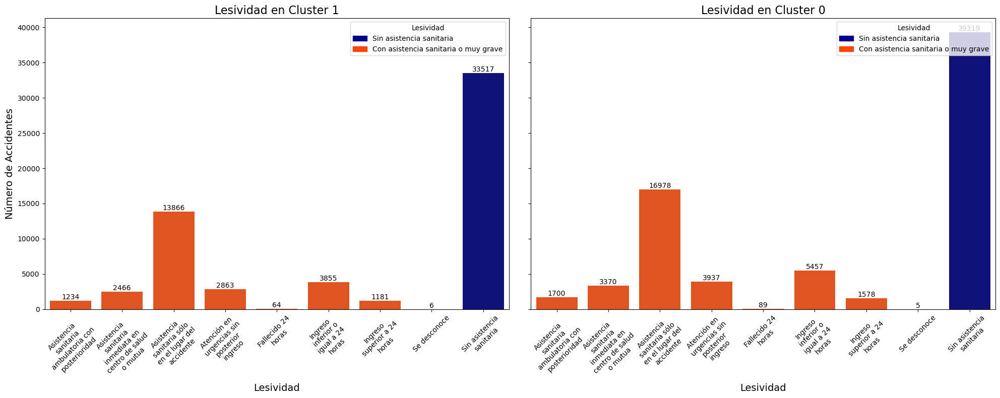

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import textwrap
from matplotlib.patches import Patch

# Configurar logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Parámetros de visualización
LABEL_FONT_SIZE = 10
LABEL_WRAP_WIDTH = 15

# Función para ajustar etiquetas
def wrap_labels(labels, width=15):
    wrapped_labels = []
    for label in labels:
        wrapped = '\n'.join(textwrap.wrap(label, width=width))
        wrapped_labels.append(wrapped)
    return wrapped_labels

# Verificar que las columnas necesarias existen en df
required_columns = ['cluster_espacial', 'lesividad']
for col in required_columns:
    if col not in df.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Convertir 'lesividad' a tipo categórico si aún no lo está
if not pd.api.types.is_categorical_dtype(df['lesividad']):
    df['lesividad'] = df['lesividad'].astype('category')

# Definir los colores específicos para las categorías de 'lesividad'
palette_colors = {
    'Sin asistencia sanitaria': 'darkblue',
    'Desconocido': 'black'
}
for categoria in df['lesividad'].cat.categories:
    if categoria not in palette_colors:
        palette_colors[categoria] = 'orangered'

# Crear una figura con un subplot por cada valor de 'cluster_espacial'
cluster_values = df['cluster_espacial'].unique()
fig, axes = plt.subplots(nrows=1, ncols=len(cluster_values), figsize=(20, 8), sharey=True)

for cluster, ax in zip(cluster_values, axes):
    # Filtrar el DataFrame para el valor actual de 'cluster_espacial'
    df_cluster = df[df['cluster_espacial'] == cluster]
    
    if df_cluster.empty:
        logging.warning(f"No hay datos para el cluster '{cluster}'.")
        ax.set_title(f'No hay datos para Cluster {cluster}', fontsize=16)
        ax.axis('off')
        continue
    
    # Crear el gráfico de barras
    sns.countplot(
        data=df_cluster,
        x='lesividad',
        ax=ax,
        palette=palette_colors,
        order=df['lesividad'].cat.categories
    )
    
    ax.set_title(f'Lesividad en Cluster {cluster}', fontsize=16)
    ax.set_xlabel('Lesividad', fontsize=14)
    ax.set_ylabel('Número de Accidentes', fontsize=14)
    ax.tick_params(axis='x', rotation=45)
    
    # Ajustar las etiquetas del eje x
    original_labels = [label.get_text() for label in ax.get_xticklabels()]
    wrapped_labels = wrap_labels(original_labels, width=LABEL_WRAP_WIDTH)
    ax.set_xticklabels(wrapped_labels, fontsize=LABEL_FONT_SIZE)
    
    # Añadir anotaciones de conteo en cada barra
    for p in ax.patches:
        height = int(p.get_height())
        ax.annotate(format(height, 'd'),
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=LABEL_FONT_SIZE)
    
    # Añadir una leyenda personalizada
    legend_elements = [
        Patch(facecolor='darkblue', edgecolor='darkblue', label='Sin asistencia sanitaria'),
        Patch(facecolor='orangered', edgecolor='orangered', label='Con asistencia sanitaria o muy grave')
    ]
    ax.legend(handles=legend_elements, title='Lesividad', loc='upper right')

# Ajustar el espacio entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [13]:
import pandas as pd

# Asignar valores binarios a 'lesividad': 0 = 'Sin asistencia sanitaria', 1 = resto
df['lesividad_binaria'] = df['lesividad'].apply(lambda x: 0 if x == 'Sin asistencia sanitaria' else 1)

# Agrupar por 'cluster_espacial' y calcular los porcentajes de 'lesividad_binaria'
porcentajes = df.groupby('cluster_espacial')['lesividad_binaria'].value_counts(normalize=True).unstack() * 100

# Renombrar las columnas para mayor claridad
porcentajes.columns = ['% Sin asistencia sanitaria', '% Con asistencia sanitaria o grave']

# Mostrar los resultados
print(porcentajes)


                  % Sin asistencia sanitaria  \
cluster_espacial                               
0                                  54.283269   
1                                  56.758450   

                  % Con asistencia sanitaria o grave  
cluster_espacial                                      
0                                          45.716731  
1                                          43.241550  


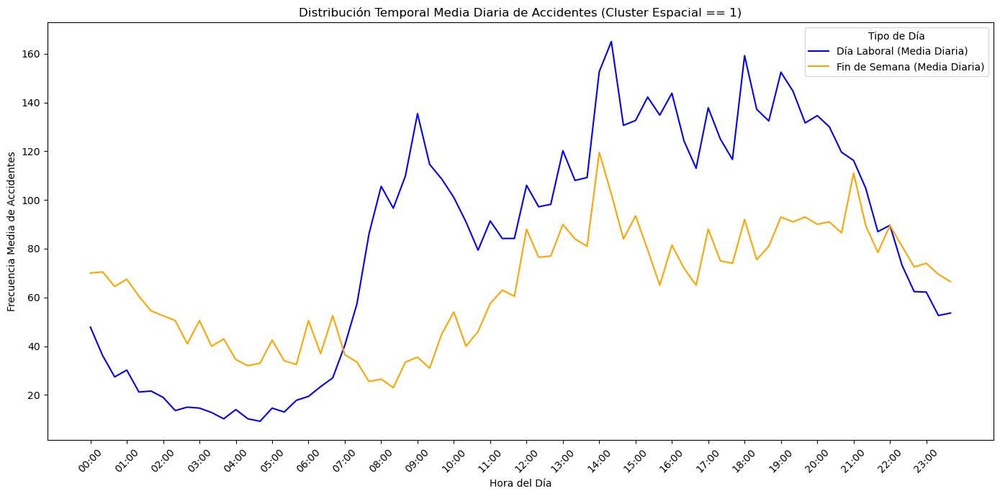

In [87]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_temporal_distribution(df):
    # Filtrar los datos donde 'cluster_espacial' es igual a 1
    df_cluster_1 = df[df['cluster_espacial'] == 1].copy()

    # Convertir 'fecha' y 'hora' en un datetime completo
    df_cluster_1['datetime'] = pd.to_datetime(df_cluster_1['fecha'] + ' ' + df_cluster_1['hora'], errors='coerce')

    # Crear una columna para distinguir entre días de semana y fines de semana
    df_cluster_1['day_type'] = df_cluster_1['day_of_week'].apply(lambda x: 'fin_de_semana' if x in [5, 6] else 'dia_laboral')

    # Resamplear en intervalos de 20 minutos y contar el número de registros
    temporal_distribution = df_cluster_1.set_index('datetime').groupby('day_type').resample('20min').size().unstack(level=0).fillna(0)

    # Reiniciar el índice para extraer la columna Time
    temporal_distribution = temporal_distribution.reset_index()
    # Formatear 'datetime' para que solo incluya horas y minutos
    temporal_distribution['Time'] = temporal_distribution['datetime'].dt.strftime('%H:%M')

    # Eliminar las columnas 'datetime' y 'day_type' para evitar conflictos
    temporal_distribution = temporal_distribution.drop(columns=['datetime', 'day_type'], errors='ignore')

    # Agrupar por la columna 'Time' para sumar los valores de dia_laboral y fin_de_semana
    temporal_distribution = temporal_distribution.groupby('Time').sum().reset_index()

    # Ordenar los tiempos correctamente
    temporal_distribution = temporal_distribution.sort_values('Time')

    # Verificar que las columnas son numéricas
    temporal_distribution['dia_laboral'] = pd.to_numeric(temporal_distribution['dia_laboral'], errors='coerce')
    temporal_distribution['fin_de_semana'] = pd.to_numeric(temporal_distribution['fin_de_semana'], errors='coerce')

    # Calcular la media diaria
    temporal_distribution['dia_laboral_media'] = temporal_distribution['dia_laboral'] / 5
    temporal_distribution['fin_de_semana_media'] = temporal_distribution['fin_de_semana'] / 2


    # Configurar gráficos
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=temporal_distribution, x="Time", y="dia_laboral_media", label="Día Laboral (Media Diaria)", color="blue")
    sns.lineplot(data=temporal_distribution, x="Time", y="fin_de_semana_media", label="Fin de Semana (Media Diaria)", color="orange")
    plt.title("Distribución Temporal Media Diaria de Accidentes (Cluster Espacial == 1)")
    plt.xlabel("Hora del Día")
    plt.ylabel("Frecuencia Media de Accidentes")
    
    # Ajustar las etiquetas del eje X para mostrar solo las horas enteras
    time_values = temporal_distribution['Time'].unique()
    # Encontrar las posiciones donde los minutos son '00'
    tick_positions = [i for i, t in enumerate(time_values) if t.endswith(':00')]
    # Crear las etiquetas correspondientes
    tick_labels = [t for t in time_values if t.endswith(':00')]
    # Establecer las posiciones y etiquetas de los ticks
    plt.xticks(ticks=tick_positions, labels=tick_labels, rotation=45)

    plt.legend(title="Tipo de Día")
    plt.tight_layout()
    plt.show()

# Ejecuta en tu entorno local
plot_temporal_distribution(df_no_dupl)








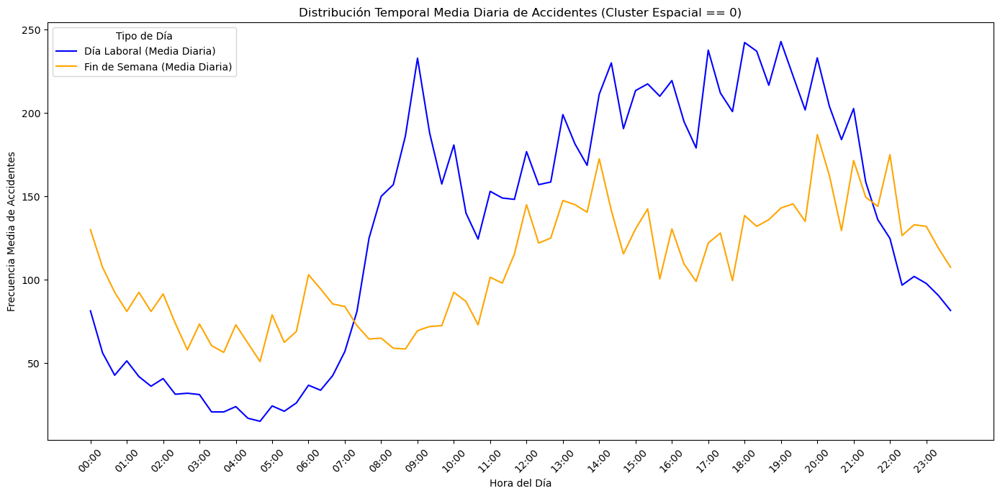

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_temporal_distribution(df):
    # Filtrar los datos donde 'cluster_espacial' es igual a 1
    df_cluster_0 = df[df['cluster_espacial'] == 0].copy()

    # Convertir 'fecha' y 'hora' en un datetime completo
    df_cluster_0['datetime'] = pd.to_datetime(df_cluster_0['fecha'] + ' ' + df_cluster_0['hora'], errors='coerce')

    # Crear una columna para distinguir entre días de semana y fines de semana
    df_cluster_0['day_type'] = df_cluster_0['day_of_week'].apply(lambda x: 'fin_de_semana' if x in [5, 6] else 'dia_laboral')

    # Resamplear en intervalos de 20 minutos y contar el número de registros
    temporal_distribution = df_cluster_0.set_index('datetime').groupby('day_type').resample('20min').size().unstack(level=0).fillna(0)

    # Reiniciar el índice para extraer la columna Time
    temporal_distribution = temporal_distribution.reset_index()
    # Formatear 'datetime' para que solo incluya horas y minutos
    temporal_distribution['Time'] = temporal_distribution['datetime'].dt.strftime('%H:%M')

    # Eliminar las columnas 'datetime' y 'day_type' para evitar conflictos
    temporal_distribution = temporal_distribution.drop(columns=['datetime', 'day_type'], errors='ignore')

    # Agrupar por la columna 'Time' para sumar los valores de dia_laboral y fin_de_semana
    temporal_distribution = temporal_distribution.groupby('Time').sum().reset_index()

    # Ordenar los tiempos correctamente
    temporal_distribution = temporal_distribution.sort_values('Time')

    # Verificar que las columnas son numéricas
    temporal_distribution['dia_laboral'] = pd.to_numeric(temporal_distribution['dia_laboral'], errors='coerce')
    temporal_distribution['fin_de_semana'] = pd.to_numeric(temporal_distribution['fin_de_semana'], errors='coerce')

    # Calcular la media diaria
    temporal_distribution['dia_laboral_media'] = temporal_distribution['dia_laboral'] / 5
    temporal_distribution['fin_de_semana_media'] = temporal_distribution['fin_de_semana'] / 2

    # Configurar gráficos
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=temporal_distribution, x="Time", y="dia_laboral_media", label="Día Laboral (Media Diaria)", color="blue")
    sns.lineplot(data=temporal_distribution, x="Time", y="fin_de_semana_media", label="Fin de Semana (Media Diaria)", color="orange")
    plt.title("Distribución Temporal Media Diaria de Accidentes (Cluster Espacial == 0)")
    plt.xlabel("Hora del Día")
    plt.ylabel("Frecuencia Media de Accidentes")
    
    # Ajustar las etiquetas del eje X para mostrar solo las horas enteras
    time_values = temporal_distribution['Time'].unique()
    # Encontrar las posiciones donde los minutos son '00'
    tick_positions = [i for i, t in enumerate(time_values) if t.endswith(':00')]
    # Crear las etiquetas correspondientes
    tick_labels = [t for t in time_values if t.endswith(':00')]
    # Establecer las posiciones y etiquetas de los ticks
    plt.xticks(ticks=tick_positions, labels=tick_labels, rotation=45)

    plt.legend(title="Tipo de Día")
    plt.tight_layout()
    plt.show()

# Ejecuta en tu entorno local
plot_temporal_distribution(df_no_dupl)



In [61]:
df['fecha']

datetime
2019-02-04 09:10:00    2019-02-04
2019-02-04 09:10:00    2019-02-04
2019-01-01 03:45:00    2019-01-01
2019-01-01 03:45:00    2019-01-01
2019-01-01 03:45:00    2019-01-01
                          ...    
2024-06-01 03:28:00    2024-06-01
2024-05-17 15:15:00    2024-05-17
2024-05-17 15:15:00    2024-05-17
2024-06-03 13:10:00    2024-06-03
2024-06-03 13:10:00    2024-06-03
Name: fecha, Length: 239935, dtype: object

In [126]:
df['cluster_espacial'].value_counts()

cluster_espacial
0    143144
1     96791
Name: count, dtype: int64

In [109]:
df['fecha']

datetime
2019-02-04 09:10:00   2019-02-04
2019-02-04 09:10:00   2019-02-04
2019-01-01 03:45:00   2019-01-01
2019-01-01 03:45:00   2019-01-01
2019-01-01 03:45:00   2019-01-01
                         ...    
2024-06-01 03:28:00   2024-06-01
2024-05-17 15:15:00   2024-05-17
2024-05-17 15:15:00   2024-05-17
2024-06-03 13:10:00   2024-06-03
2024-06-03 13:10:00   2024-06-03
Name: fecha, Length: 239935, dtype: datetime64[ns]

In [110]:
df['time_20min']

datetime
2019-02-04 09:10:00    00:00:00
2019-02-04 09:10:00    00:00:00
2019-01-01 03:45:00    00:00:00
2019-01-01 03:45:00    00:00:00
2019-01-01 03:45:00    00:00:00
                         ...   
2024-06-01 03:28:00    00:00:00
2024-05-17 15:15:00    00:00:00
2024-05-17 15:15:00    00:00:00
2024-06-03 13:10:00    00:00:00
2024-06-03 13:10:00    00:00:00
Name: time_20min, Length: 239935, dtype: object

In [133]:
df['hora']

0        2024-11-11 09:10:00
1        2024-11-11 09:10:00
2        2024-11-11 03:45:00
3        2024-11-11 03:45:00
4        2024-11-11 03:45:00
                 ...        
239930   2024-11-11 03:28:00
239931   2024-11-11 15:15:00
239932   2024-11-11 15:15:00
239933   2024-11-11 13:10:00
239934   2024-11-11 13:10:00
Name: hora, Length: 239935, dtype: datetime64[ns]

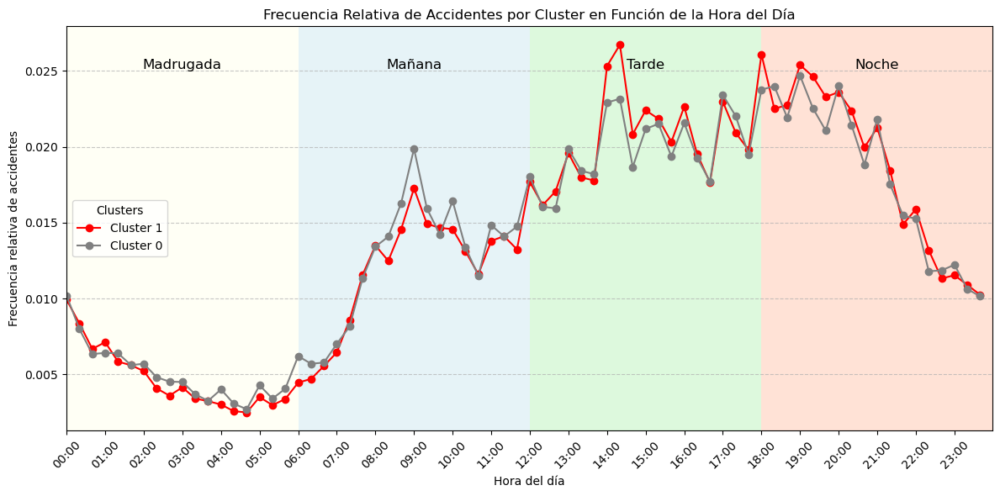

In [139]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Suponiendo que 'df' es tu DataFrame y 'cluster_espacial' es la columna que indica el cluster

def plot_relative_frequency_per_cluster(df):
    # Asegurarse de que 'hora' esté en formato datetime sin modificar el DataFrame original
    hora_temporal = pd.to_datetime(df['hora'], errors='coerce')
    
    # Agrupar los minutos en intervalos de 20 minutos
    hora_temporal_agrupada = hora_temporal.dt.floor('20min')
    
    # Añadir la columna de hora agrupada al DataFrame
    df = df.copy()
    df['hora_20min'] = hora_temporal_agrupada
    
    # Obtener la lista de clusters únicos
    clusters_unicos = df['cluster_espacial'].unique()
    
    # Crear una figura
    plt.figure(figsize=(12, 6))
    
    # Colores para cada cluster
    colores = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
    
    # Iterar sobre cada cluster para calcular y graficar la frecuencia relativa
    for idx, cluster in enumerate(clusters_unicos):
        # Filtrar los datos por cluster
        df_cluster = df[df['cluster_espacial'] == cluster]
        
        # Contar la cantidad de accidentes por cada intervalo de 20 minutos para el cluster actual
        accidents_per_time = df_cluster['hora_20min'].value_counts().sort_index()
        
        # Normalizar por el total de accidentes del cluster para obtener la frecuencia relativa
        frecuencia_relativa = accidents_per_time / accidents_per_time.sum()
        
        # Asegurarse de que el índice es datetime
        frecuencia_relativa.index = pd.to_datetime(frecuencia_relativa.index)
        
        # Graficar la frecuencia relativa
        plt.plot(frecuencia_relativa.index, frecuencia_relativa.values, marker='o', linestyle='-', color='red' if cluster == 1 else 'gray', label=f'Cluster {cluster}')
    
    # Configurar etiquetas y título
    plt.xlabel('Hora del día')
    plt.ylabel('Frecuencia relativa de accidentes')
    plt.title('Frecuencia Relativa de Accidentes por Cluster en Función de la Hora del Día')
    
    # Añadir divisiones del día y cambiar el color del fondo
    plt.axvspan(pd.to_datetime('00:00'), pd.to_datetime('06:00'), facecolor='lightyellow', alpha=0.3)
    plt.axvspan(pd.to_datetime('06:00'), pd.to_datetime('12:00'), facecolor='lightblue', alpha=0.3)
    plt.axvspan(pd.to_datetime('12:00'), pd.to_datetime('18:00'), facecolor='lightgreen', alpha=0.3)
    plt.axvspan(pd.to_datetime('18:00'), pd.to_datetime('23:59'), facecolor='lightsalmon', alpha=0.3)
    
    # Añadir texto para cada parte del día
    plt.text(pd.to_datetime('03:00'), plt.ylim()[1]*0.9, 'Madrugada', fontsize=12, color='black', ha='center')
    plt.text(pd.to_datetime('09:00'), plt.ylim()[1]*0.9, 'Mañana', fontsize=12, color='black', ha='center')
    plt.text(pd.to_datetime('15:00'), plt.ylim()[1]*0.9, 'Tarde', fontsize=12, color='black', ha='center')
    plt.text(pd.to_datetime('21:00'), plt.ylim()[1]*0.9, 'Noche', fontsize=12, color='black', ha='center')
    
    # Formatear el eje X para mostrar solo las horas enteras
    plt.gca().xaxis.set_major_locator(mdates.HourLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    
    # Ajustar límites y etiquetas del eje x
    plt.xticks(rotation=45)
    plt.xlim(pd.to_datetime('00:00'), pd.to_datetime('23:59'))
    
    # Añadir leyenda
    plt.legend(title='Clusters', loc='center left')
    
    # Mostrar la cuadrícula
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Ejecutar la función con tu DataFrame
plot_relative_frequency_per_cluster(df)


Distribución anual:

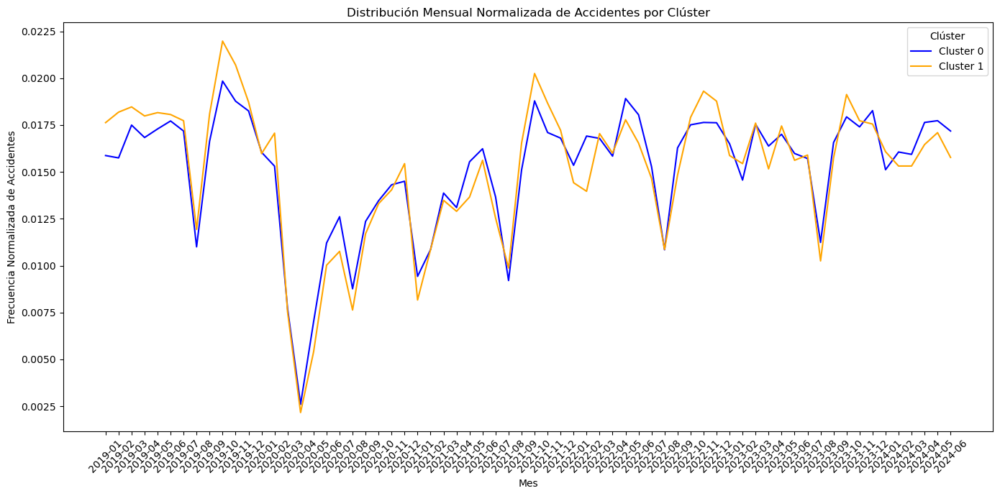

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_monthly_distribution(df):
    # Crear una columna 'fecha' en formato datetime para facilitar el análisis mensual
    df['fecha'] = pd.to_datetime(df['fecha'], errors='coerce')

    # Agrupar por mes y contar la frecuencia de accidentes para cada clúster
    monthly_distribution = df.groupby([df['fecha'].dt.to_period('M'), 'cluster_espacial']).size().unstack(level=1).fillna(0)

    # Normalizar cada clúster dividiendo por el número total de datos en cada clúster
    cluster_totals = monthly_distribution.sum()
    normalized_distribution = monthly_distribution.div(cluster_totals, axis=1)

    # Configurar gráficos
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=normalized_distribution, x=normalized_distribution.index.astype(str), y=0, label="Cluster 0", color="blue")
    sns.lineplot(data=normalized_distribution, x=normalized_distribution.index.astype(str), y=1, label="Cluster 1", color="orange")
    plt.title("Distribución Mensual Normalizada de Accidentes por Clúster")
    plt.xlabel("Mes")
    plt.ylabel("Frecuencia Normalizada de Accidentes")
    plt.legend(title="Clúster")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Ejecuta en tu entorno local
plot_monthly_distribution(df_no_dupl)



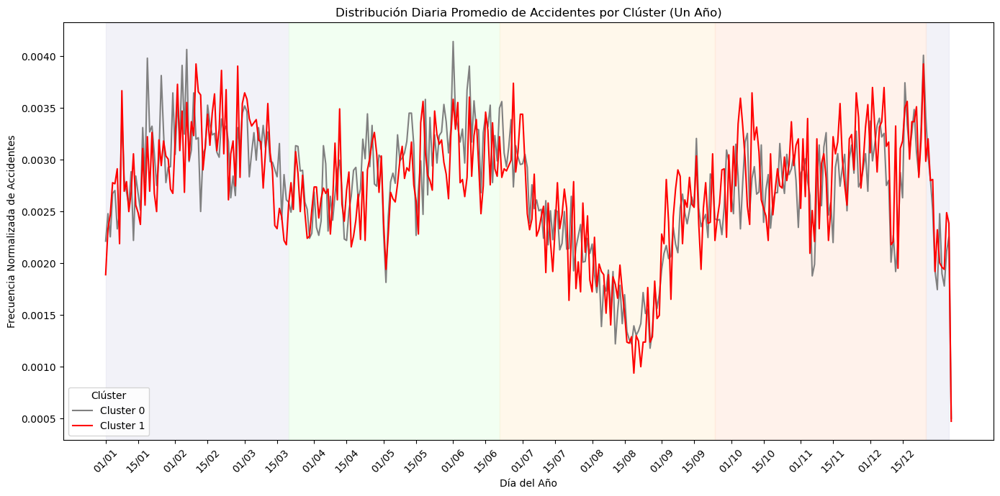

In [140]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as patches

def plot_daily_distribution_average_year(df):
    # Crear una columna 'fecha' en formato datetime para facilitar el análisis diario
    df['fecha'] = pd.to_datetime(df['fecha'], errors='coerce')
    
    # Extraer el día del año para calcular la media diaria sobre múltiples años
    df['day_of_year'] = df['fecha'].dt.dayofyear

    # Agrupar por día del año y clúster, luego calcular la media diaria
    daily_distribution = df.groupby(['day_of_year', 'cluster_espacial']).size().unstack(level=1).fillna(0)
    daily_distribution_average = daily_distribution.groupby('day_of_year').mean()

    # Normalizar cada clúster dividiendo por el número total de datos en cada clúster
    cluster_totals = daily_distribution_average.sum()
    normalized_distribution = daily_distribution_average.div(cluster_totals, axis=1)

    # Configurar gráficos
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=normalized_distribution, x=normalized_distribution.index, y=0, label="Cluster 0", color="gray")
    sns.lineplot(data=normalized_distribution, x=normalized_distribution.index, y=1, label="Cluster 1", color="red")

    # Establecer etiquetas del eje x (día del año) en el primer día y el día 15 de cada mes
    month_days = [1, 15]
    month_ticks = [(month-1)*30 + day for month in range(1, 13) for day in month_days]  # Aproximación lineal de 30 días por mes
    month_labels = [f"{str(day).zfill(2)}/{str(month).zfill(2)}" for month in range(1, 13) for day in month_days]
    plt.xticks(month_ticks, month_labels, rotation=45)

    # Colorear fondo en función de las estaciones del año
    season_colors = {
        "winter": (0.9, 0.9, 0.95, 0.5),   # Light blue for winter
        "spring": (0.9, 1.0, 0.9, 0.5),    # Light green for spring
        "summer": (1.0, 0.95, 0.85, 0.5),  # Light orange for summer
        "fall": (1.0, 0.9, 0.85, 0.5)      # Light red for fall
    }
    # Definir los intervalos de días para cada estación
    season_intervals = {
        "winter": [(1, 80), (355, 365)],   # Invierno: Ene-Marzo y Dic
        "spring": [(80, 171)],             # Primavera: Abril-Junio
        "summer": [(171, 264)],            # Verano: Julio-Sept
        "fall": [(264, 355)]               # Otoño: Oct-Nov
    }

    # Añadir fondo de color para cada estación
    for season, intervals in season_intervals.items():
        color = season_colors[season]
        for start, end in intervals:
            plt.axvspan(start, end, color=color)

    # Etiquetas y título
    plt.title("Distribución Diaria Promedio de Accidentes por Clúster (Un Año)")
    plt.xlabel("Día del Año")
    plt.ylabel("Frecuencia Normalizada de Accidentes")
    plt.legend(title="Clúster")
    plt.tight_layout()
    plt.show()

# Ejecuta en tu entorno local
plot_daily_distribution_average_year(df)



In [152]:
df[df['cluster_espacial'] == 1]['vehiculo_mas_4_ruedas'].value_counts()[0]

17598

In [154]:
cl1 = df[df['cluster_espacial'] == 1]['vehiculo_mas_4_ruedas'].value_counts()
cl2 = df[df['cluster_espacial'] == 0]['vehiculo_mas_4_ruedas'].value_counts()
print(f"Cluster 1:{cl1}")
print(f"Porcentaje vehiculos con menos de 4 ruedas: {100*cl1[0]/(cl1[1]+cl1[0])}")
print(f"\nCluster 0:{cl2}")
print(f"Porcentaje vehiculos con menos de 4 ruedas: {100*cl2[0]/(cl2[1]+cl2[0])}")

Cluster 1:vehiculo_mas_4_ruedas
1    79193
0    17598
Name: count, dtype: int64
Porcentaje vehiculos con menos de 4 ruedas: 18.181442489487658

Cluster 0:vehiculo_mas_4_ruedas
1    120951
0     22193
Name: count, dtype: int64
Porcentaje vehiculos con menos de 4 ruedas: 15.50396803219136


In [98]:
def calculate_seasonal_frequencies(df):
    # Crear una columna 'fecha' en formato datetime para facilitar el análisis
    df['fecha'] = pd.to_datetime(df['fecha'], errors='coerce')
    
    # Extraer el día del año para clasificar en estaciones
    df['day_of_year'] = df['fecha'].dt.dayofyear

    # Agrupar por día del año y clúster, luego calcular la media diaria
    daily_distribution = df.groupby(['day_of_year', 'cluster_espacial']).size().unstack(level=1).fillna(0)
    
    # Normalizar cada clúster dividiendo por el número total de datos en cada clúster
    cluster_totals = daily_distribution.sum()
    normalized_distribution = daily_distribution.div(cluster_totals, axis=1).reset_index()

    # Definir los intervalos de días para cada estación
    season_intervals = {
        "winter": [(1, 80), (355, 365)],   # Invierno: Ene-Marzo y Dic
        "spring": [(80, 171)],             # Primavera: Abril-Junio
        "summer": [(171, 264)],            # Verano: Julio-Sept
        "fall": [(264, 355)]               # Otoño: Oct-Nov
    }
    
    # Asignar cada fila a una estación
    def get_season(day):
        for season, intervals in season_intervals.items():
            for start, end in intervals:
                if start <= day <= end:
                    return season
        return None

    # Asignar la estación basada en el día del año
    normalized_distribution['season'] = normalized_distribution['day_of_year'].apply(get_season)
    
    # Agrupar por estación y calcular la frecuencia normalizada por clúster
    seasonal_distribution = normalized_distribution.groupby('season').sum().drop(columns='day_of_year')
    
    print("Frecuencia Normalizada por Estación y Clúster:\n", seasonal_distribution)

    # Calcular la relación porcentual entre la frecuencia normalizada del clúster 1 y el clúster 0
    if 0 in seasonal_distribution.columns and 1 in seasonal_distribution.columns:
        ratio = 100 * (seasonal_distribution[1] / seasonal_distribution[0])
        print("\nRelación Porcentual entre Clúster 1 y Clúster 0 (en %):\n", ratio)
    else:
        print("\nUno o ambos clústers no están presentes en los datos para todos los intervalos de estaciones.")

# Ejecuta en tu entorno local
calculate_seasonal_frequencies(df_no_dupl)



Frecuencia Normalizada por Estación y Clúster:
 cluster_espacial         0         1
season                              
fall              0.256356  0.268722
spring            0.267279  0.257428
summer            0.210063  0.206349
winter            0.265813  0.266992

Relación Porcentual entre Clúster 1 y Clúster 0 (en %):
 season
fall      104.823727
spring     96.314143
summer     98.232256
winter    100.443491
dtype: float64


Según el día de la semana:

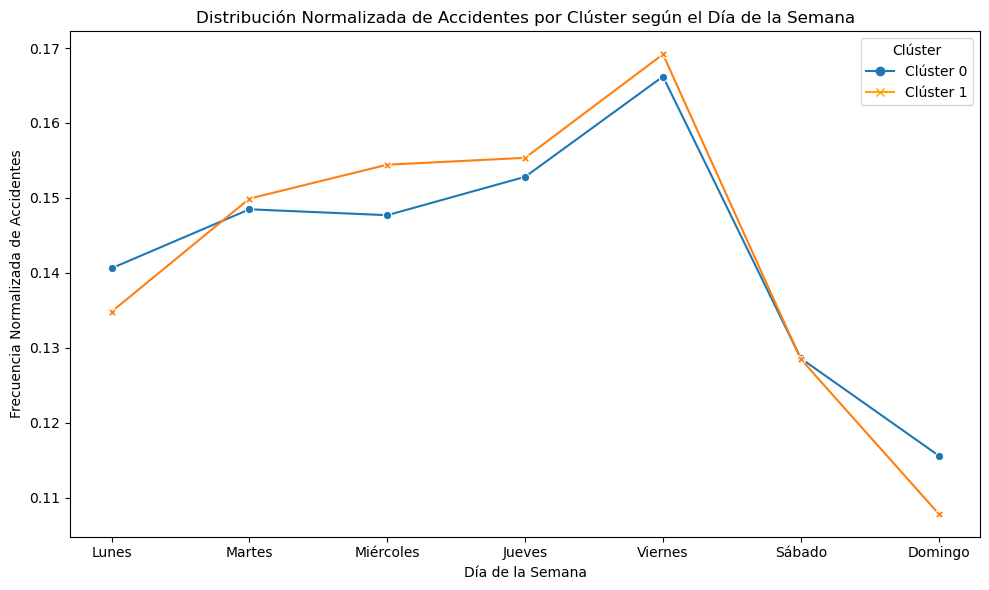

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_weekday_distribution(df):
    # Crear una columna 'fecha' en formato datetime para extraer el día de la semana
    df['fecha'] = pd.to_datetime(df['fecha'], errors='coerce')

    # Extraer el día de la semana (0 = lunes, 6 = domingo)
    df['day_of_week'] = df['fecha'].dt.dayofweek

    # Agrupar por día de la semana y clúster, luego contar los accidentes en cada grupo
    weekday_distribution = df.groupby(['day_of_week', 'cluster_espacial']).size().unstack(level=1).fillna(0)

    # Normalizar cada clúster dividiendo por el número total de datos en ese clúster
    cluster_totals = weekday_distribution.sum()
    normalized_distribution = weekday_distribution.div(cluster_totals, axis=1)

    # Etiquetas de los días de la semana
    days_labels = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

    # Configurar el gráfico
    plt.figure(figsize=(10, 6))
    ax = sns.lineplot(data=normalized_distribution, markers=True, dashes=False)

    # Configurar las etiquetas del eje x
    plt.xticks(ticks=range(7), labels=days_labels)
    plt.title("Distribución Normalizada de Accidentes por Clúster según el Día de la Semana")
    plt.xlabel("Día de la Semana")
    plt.ylabel("Frecuencia Normalizada de Accidentes")

    # Personalizar la leyenda para que los símbolos representen correctamente cada clúster
    new_handles = [
        plt.Line2D([], [], color="#1f77b4", marker='o', linestyle='-', label='Clúster 0'),
        plt.Line2D([], [], color="orange", marker='x', linestyle='-', label='Clúster 1')
    ]
    ax.legend(handles=new_handles, title="Clúster")

    plt.tight_layout()
    plt.show()

# Ejecuta en tu entorno local
plot_weekday_distribution(df_no_dupl)




Visualizaremos ahora la relación con la cercanía a intersecciones:

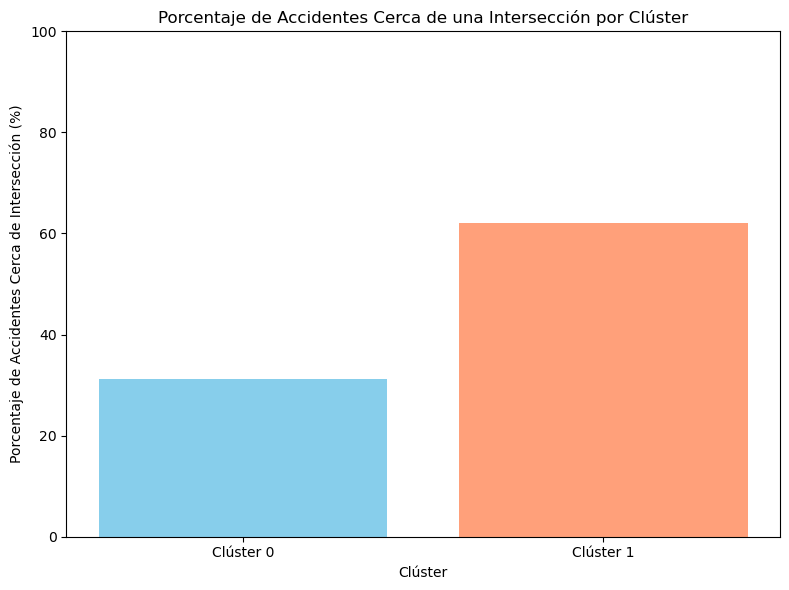

In [110]:
import matplotlib.pyplot as plt

def plot_close_to_intersection_percentage(df):
    # Filtrar los datos para cada clúster
    df_cluster_0 = df[df['cluster_espacial'] == 0]
    df_cluster_1 = df[df['cluster_espacial'] == 1]

    # Calcular el porcentaje de accidentes cerca de una intersección para cada clúster
    close_to_intersection_0 = (df_cluster_0['close_to_intersection'].value_counts(normalize=True) * 100).get(1, 0)
    close_to_intersection_1 = (df_cluster_1['close_to_intersection'].value_counts(normalize=True) * 100).get(1, 0)

    # Crear el histograma
    plt.figure(figsize=(8, 6))
    plt.bar(['Clúster 0', 'Clúster 1'], [close_to_intersection_0, close_to_intersection_1], color=['#87CEEB', '#FFA07A'])
    plt.title("Porcentaje de Accidentes Cerca de una Intersección por Clúster")
    plt.xlabel("Clúster")
    plt.ylabel("Porcentaje de Accidentes Cerca de Intersección (%)")
    plt.ylim(0, 100)
    plt.tight_layout()
    plt.show()

# Ejecuta en tu entorno local
plot_close_to_intersection_percentage(df_no_dupl)


## Análisis principales clústers.

### TOP 1 CLÚSTER

In [35]:
from sklearn.cluster import DBSCAN
import numpy as np
try:
    df_reducido = df_reducido.drop('cluster_label', axis=1)
    df_reducido = df_reducido.drop('cluster', axis=1)
except:
    pass

eps=0.0002570757681663865*1.5

db = DBSCAN(eps=eps, min_samples=5).fit(df_reducido)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_outliers = list(labels).count(-1)
print ("%6.3f, %d, %d" % (eps, n_clusters_, n_outliers))
df_reducido['cluster'] = labels
df['cluster_espacial'] = labels
print(df_reducido['cluster'].value_counts().head(10))

 0.000, 11474, 77578
cluster
-1       77578
 135      2056
 124      1153
 64        769
 263       721
 802       647
 16        596
 222       474
 102       421
 1464      406
Name: count, dtype: int64


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_9724\4225367552.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [51]:
new_xlim

[-410723.9500416663, -407723.9500416663]

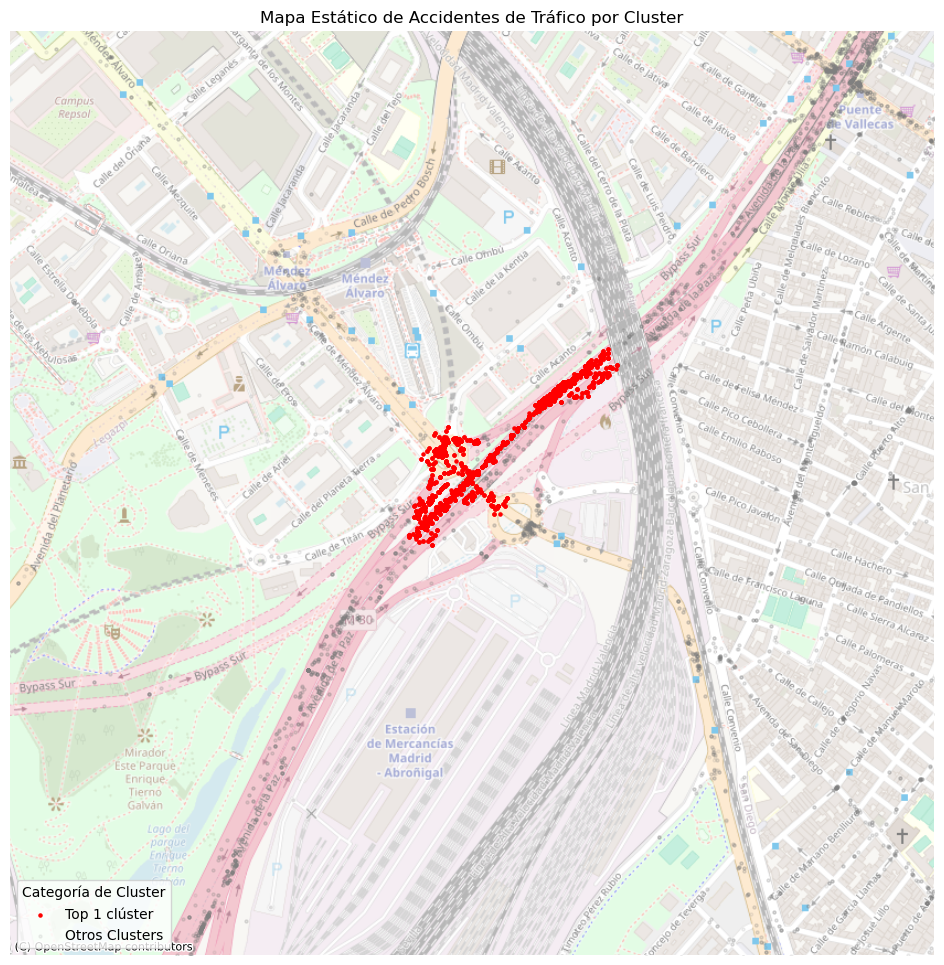

In [54]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as ctx

# Crear un GeoDataFrame a partir del DataFrame original
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitud, df.latitud),
    crs="EPSG:4326"  # Sistema de referencia de coordenadas WGS84
)

# Reproyectar a Web Mercator para facilitar la superposición con mapas base
gdf = gdf.to_crs(epsg=3857)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(12, 12))

# Graficar el cluster 135 en rojo y el resto en gris
gdf[gdf['cluster_espacial'] == 135].plot(
    ax=ax,
    marker='o',
    color='red',
    markersize=5,
    label='Top 1 clúster',
    alpha=1  # Opacidad total para el clúster 135
)

gdf[gdf['cluster_espacial'] != 135].plot(
    ax=ax,
    marker='o',
    color='gray',
    markersize=5,
    label='Otros Clusters',
    alpha=0.1  # Menor opacidad para otros clústers
)

# Configurar límites de los ejes para enfocar la región de interés
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Ampliar los límites en un factor determinado
factorx = 1
factory = 1
new_xlim = [-409267.736010 - 1000 * factorx, -409267.736010 + 1000 * factorx]
new_ylim = [4923098.790020 - 1000 *factory, 4923098.790020 + 1000 *factory]

ax.set_xlim(new_xlim)
ax.set_ylim(new_ylim)

# Añadir el mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

# Añadir leyenda y título
ax.legend(title='Categoría de Cluster')
ax.set_title('Mapa Estático de Accidentes de Tráfico por Cluster')

# Eliminar ejes para una mejor visualización
ax.set_axis_off()

# Guardar el mapa como imagen PNG
plt.savefig('mapa_estatico_accidentes.png', dpi=300, bbox_inches='tight')

# Mostrar el mapa
plt.show()


# K-Means

In [10]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Seleccionar características espaciales y temporales para clustering
features = ['coordenada_x_utm', 'coordenada_y_utm', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos']

# Crear una copia del dataset solo con las características seleccionadas
df_features = df_clustering[features]

# Escalar las características para que estén en la misma escala
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_features)


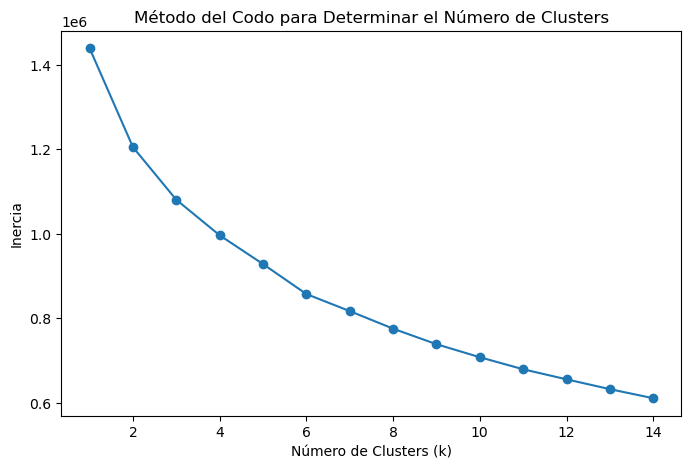

In [11]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Utilizar el método del codo para encontrar el número óptimo de clusters
inertia = []
k_range = range(1, 15)  # Puedes ajustar el rango según tus necesidades

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# Graficar la inercia para visualizar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del Codo para Determinar el Número de Clusters')
plt.show()


In [12]:
# Supongamos que el valor óptimo de k es 5 (ajusta según el resultado del método del codo)
k_opt = 6

# Aplicar K-Means con el número óptimo de clusters
kmeans = KMeans(n_clusters=k_opt, random_state=42)
labels = kmeans.fit_predict(df_scaled)

# Añadir los resultados de clustering al DataFrame original
df['cluster'] = labels


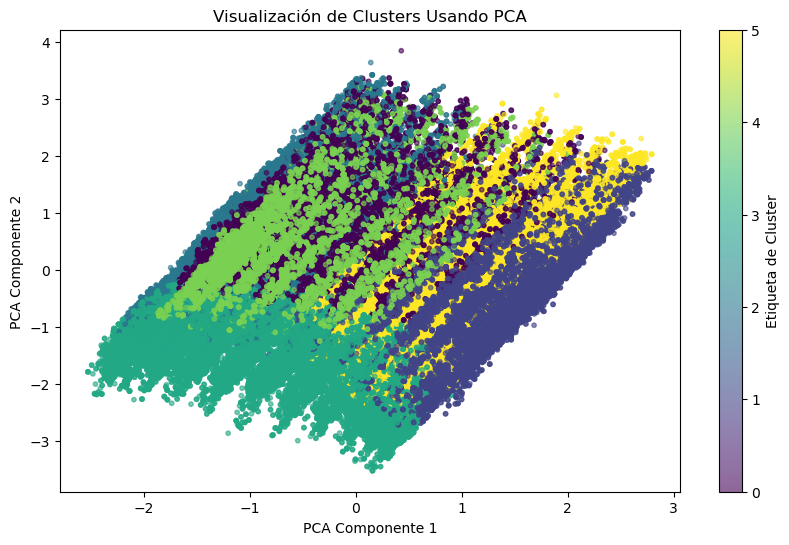

In [17]:
from sklearn.decomposition import PCA
import numpy as np

# Reducir las dimensiones a 2 para visualizar
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_scaled)

# Crear un scatter plot para los clusters
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_pca[:, 0], df_pca[:, 1], c=labels, cmap='viridis', s=10, alpha=0.6)
plt.xlabel('PCA Componente 1')
plt.ylabel('PCA Componente 2')
plt.title('Visualización de Clusters Usando PCA')
plt.colorbar(scatter, label='Etiqueta de Cluster')
plt.show()


In [18]:
from sklearn.manifold import TSNE

# Reducir las dimensiones a 2 utilizando t-SNE para visualizar
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
df_tsne = tsne.fit_transform(df_scaled)


KeyboardInterrupt: 

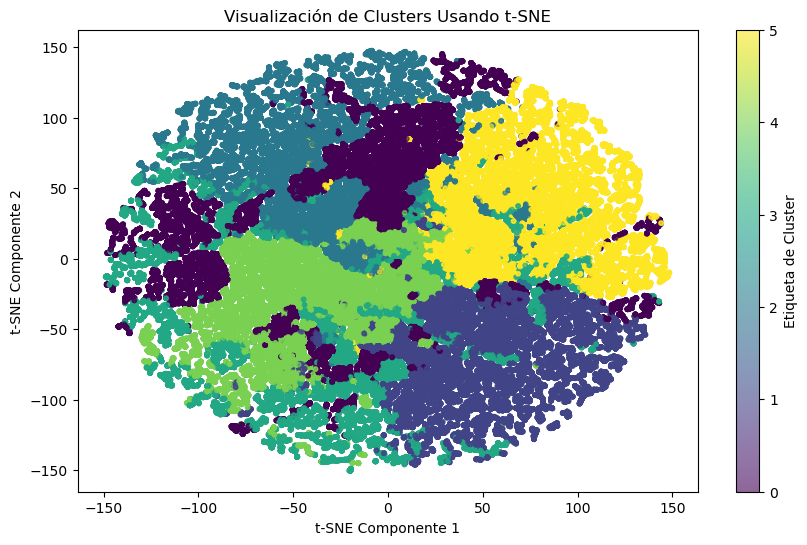

In [13]:
# Crear un scatter plot para los clusters
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_tsne[:, 0], df_tsne[:, 1], c=labels, cmap='viridis', s=10, alpha=0.6)
plt.xlabel('t-SNE Componente 1')
plt.ylabel('t-SNE Componente 2')
plt.title('Visualización de Clusters Usando t-SNE')
plt.colorbar(scatter, label='Etiqueta de Cluster')
plt.show()


## Resultados

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239935 entries, 0 to 239934
Data columns (total 48 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   fecha                          239935 non-null  object 
 1   hora                           239935 non-null  object 
 2   coordenada_x_utm               239935 non-null  float64
 3   coordenada_y_utm               239935 non-null  float64
 4   temperatura_media              239935 non-null  float64
 5   precipitaciones(mm)            239935 non-null  float64
 6   velocidad_media_aire           239935 non-null  float64
 7   oneway                         239935 non-null  int64  
 8   lanes_filled                   239935 non-null  float64
 9   mapped_highway                 239935 non-null  object 
 10  speed_limit                    239935 non-null  float64
 11  reversed                       239935 non-null  object 
 12  length                        

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_8444\4026795048.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(clusters))


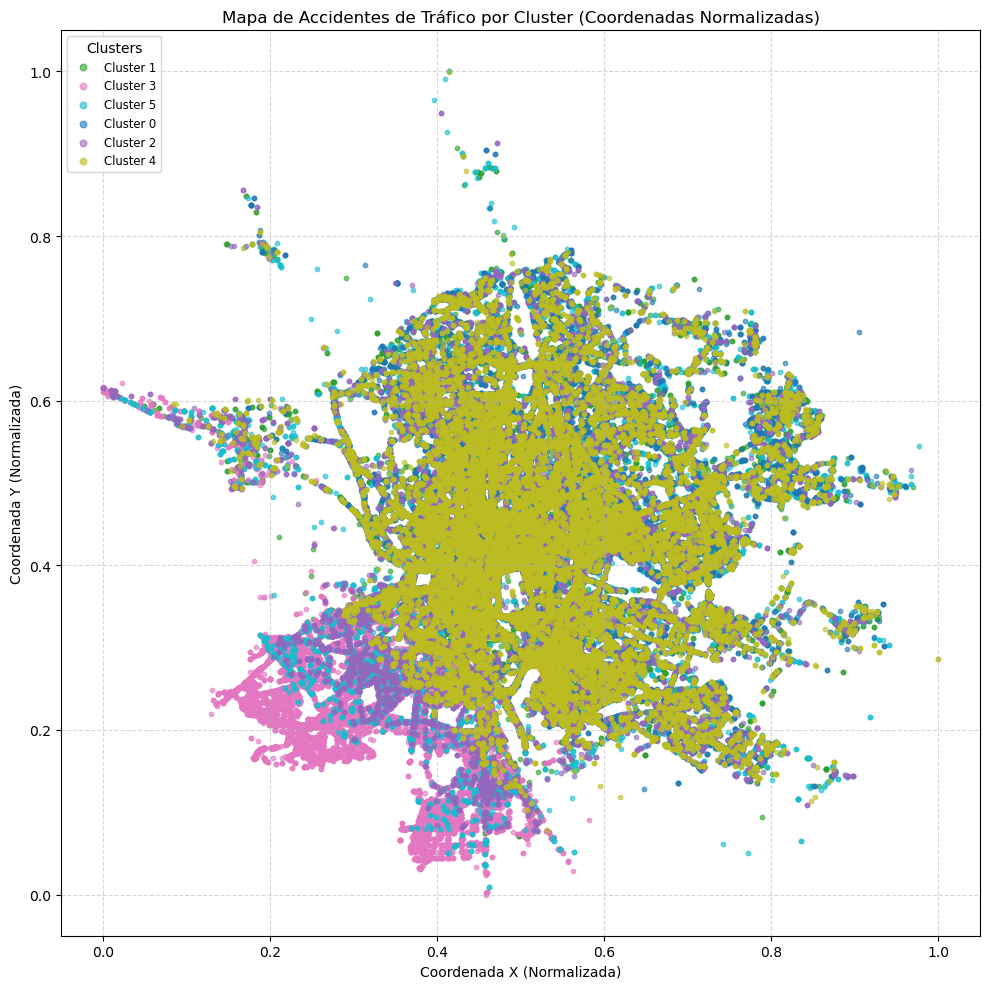

In [13]:
import matplotlib.pyplot as plt
import pandas as pd

# Crear la figura y los ejes para la visualización
fig, ax = plt.subplots(figsize=(10, 10))

# Obtener los valores únicos de clusters
clusters = df['cluster'].unique()

# Crear un mapa de colores para cada cluster
colors = plt.cm.get_cmap('tab10', len(clusters))

# Dibujar los puntos de accidentes según los clusters, coloreando cada cluster diferente
for cluster in clusters:
    cluster_points = df[df['cluster'] == cluster]
    ax.scatter(cluster_points['coordenada_x_utm'], cluster_points['coordenada_y_utm'],
               color=colors(cluster), label=f'Cluster {cluster}', s=10, alpha=0.6)

# Añadir leyenda con los clusters
plt.legend(title="Clusters", loc='upper left', fontsize='small', markerscale=1.5)

# Configuración de la visualización
plt.title('Mapa de Accidentes de Tráfico por Cluster (Coordenadas Normalizadas)')
plt.xlabel('Coordenada X (Normalizada)')
plt.ylabel('Coordenada Y (Normalizada)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# Mostrar la gráfica
plt.show()



In [19]:
df_pre['cluster'] = labels

In [21]:
df_pre.columns

Index(['fecha', 'hora', 'coordenada_x_utm', 'coordenada_y_utm',
       'temperatura_media', 'precipitaciones(mm)', 'velocidad_media_aire',
       'oneway', 'lanes_filled', 'mapped_highway', 'speed_limit', 'reversed',
       'length', 'junction', 'tunnel', 'bridge', 'edgedistance',
       'nodedistance', 'day_of_week', 'day_of_month', 'hour_sin', 'hour_cos',
       'time_of_day_Madrugada', 'time_of_day_Mañana', 'time_of_day_Noche',
       'time_of_day_Tarde', 'time_of_day_Madrugada.1', 'time_of_day_Mañana.1',
       'time_of_day_Noche.1', 'time_of_day_Tarde.1', 'day_category',
       'day_category_encoded', 'month_sin', 'month_cos', 'season_fall',
       'season_spring', 'season_summer', 'season_winter',
       'highway_Avenidas Principales', 'highway_Calles Grandes',
       'highway_Calles Pequeñas', 'highway_Carreteras/Autopistas',
       'highway_category', 'lanes_1', 'lanes_2', 'lanes_3+',
       'close_to_intersection', 'cluster'],
      dtype='object')

In [16]:
df_pre['hora']

0          9
1          9
2          3
3          3
4          3
          ..
240796     3
240797    15
240798    15
240799    13
240800    13
Name: hora, Length: 239935, dtype: int32

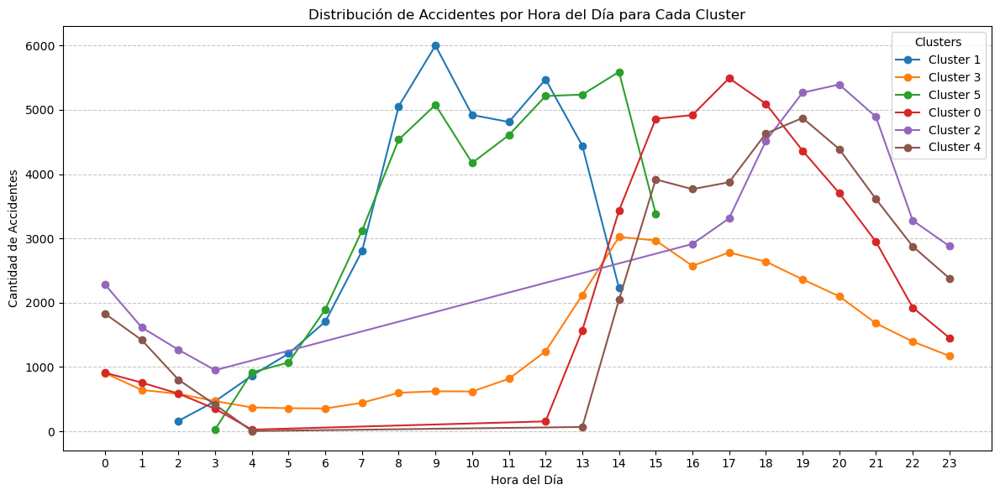

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

# Crear una columna con solo la hora a partir de la columna 'hora'
df_pre['hora'] = pd.to_datetime(df_pre['hora'], format='%H:%M:%S').dt.hour

# Crear un gráfico de barras para mostrar la distribución de cada cluster por hora del día
plt.figure(figsize=(12, 6))
for cluster in df_pre['cluster'].unique():
    cluster_data = df_pre[df_pre['cluster'] == cluster]
    cluster_hour_counts = cluster_data['hora'].value_counts().sort_index()
    plt.plot(cluster_hour_counts.index, cluster_hour_counts.values, marker='o', linestyle='-', label=f'Cluster {cluster}')

plt.xlabel('Hora del Día')
plt.ylabel('Cantidad de Accidentes')
plt.title('Distribución de Accidentes por Hora del Día para Cada Cluster')
plt.xticks(range(0, 24))
plt.legend(title='Clusters')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


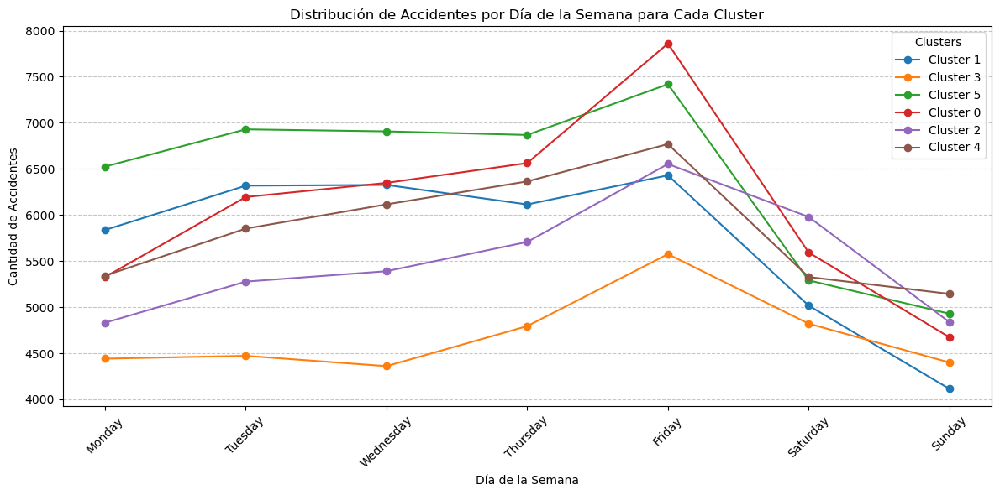

In [21]:
# Crear una columna con el día de la semana a partir de la columna 'fecha'
df_pre['dia_semana'] = pd.to_datetime(df_pre['fecha']).dt.day_name()

# Crear un gráfico de barras para mostrar la distribución de cada cluster por día de la semana
plt.figure(figsize=(12, 6))
dias_ordenados = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
for cluster in df_pre['cluster'].unique():
    cluster_data = df_pre[df_pre['cluster'] == cluster]
    cluster_weekday_counts = cluster_data['dia_semana'].value_counts().reindex(dias_ordenados)
    plt.plot(cluster_weekday_counts.index, cluster_weekday_counts.values, marker='o', linestyle='-', label=f'Cluster {cluster}')

plt.xlabel('Día de la Semana')
plt.ylabel('Cantidad de Accidentes')
plt.title('Distribución de Accidentes por Día de la Semana para Cada Cluster')
plt.xticks(rotation=45)
plt.legend(title='Clusters')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


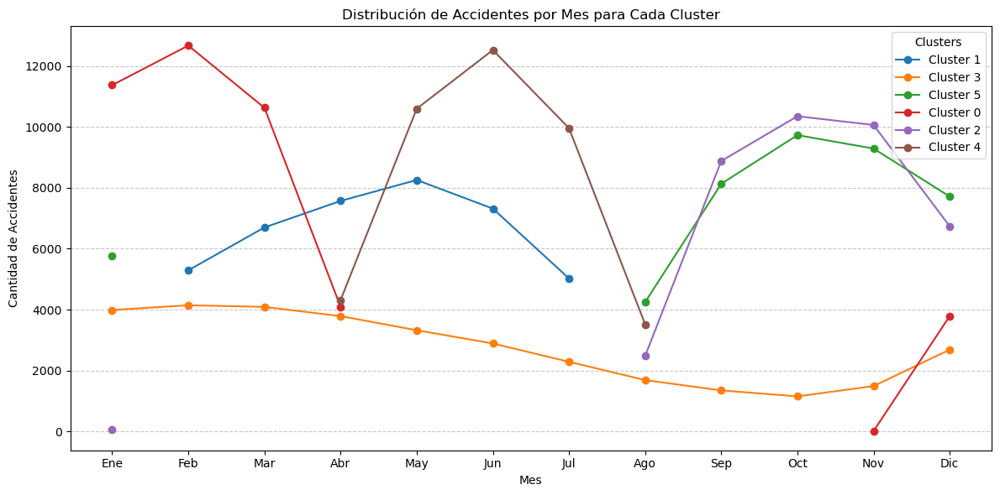

In [22]:
# Crear una columna con el número de mes a partir de la columna 'fecha'
df_pre['mes'] = pd.to_datetime(df_pre['fecha']).dt.month

# Crear un gráfico de barras para mostrar la distribución de cada cluster por mes
plt.figure(figsize=(12, 6))
meses_ordenados = range(1, 13)
for cluster in df_pre['cluster'].unique():
    cluster_data = df_pre[df_pre['cluster'] == cluster]
    cluster_month_counts = cluster_data['mes'].value_counts().reindex(meses_ordenados)
    plt.plot(cluster_month_counts.index, cluster_month_counts.values, marker='o', linestyle='-', label=f'Cluster {cluster}')

plt.xlabel('Mes')
plt.ylabel('Cantidad de Accidentes')
plt.title('Distribución de Accidentes por Mes para Cada Cluster')
plt.xticks(meses_ordenados, ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.legend(title='Clusters')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Clustering espacio-temporal de lesividades.

GMM:

In [73]:
df[['coordenada_x_utm_norm', 'coordenada_y_utm_norm', 'hour_sin', 'hour_cos']].describe()

,coordenada_x_utm_norm,coordenada_y_utm_norm,hour_sin,hour_cos
count,239935.000000,239935.000000,239935.000000,239935.000000
mean,0.493974,0.399853,-0.284993,-0.167542
std,0.130640,0.139252,0.661554,0.673096
min,0.000000,0.000000,-1.000000,-1.000000
25%,0.411140,0.290780,-0.866025,-0.866025
50%,0.481987,0.403090,-0.500000,-0.258819
75%,0.566706,0.496361,0.258819,0.500000
max,1.000000,1.000000,1.000000,1.000000


lesividad_binaria       0.0       1.0
cluster_esptemp                      
0                  0.576028  0.423972
1                  0.487805  0.512195
2                  0.504595  0.495405
3                  0.593346  0.406654
4                  0.548625  0.451375
5                  0.578561  0.421439
6                  0.559877  0.440123
7                  0.555480  0.444520
8                  0.549780  0.450220
9                  0.585698  0.414302
10                 0.544031  0.455969
11                 0.531957  0.468043
12                 0.507148  0.492852
13                 0.521180  0.478820
14                 0.569550  0.430450
15                 0.554375  0.445625
16                 0.544072  0.455928
17                 0.515368  0.484632
18                 0.567992  0.432008
19                 0.562814  0.437186


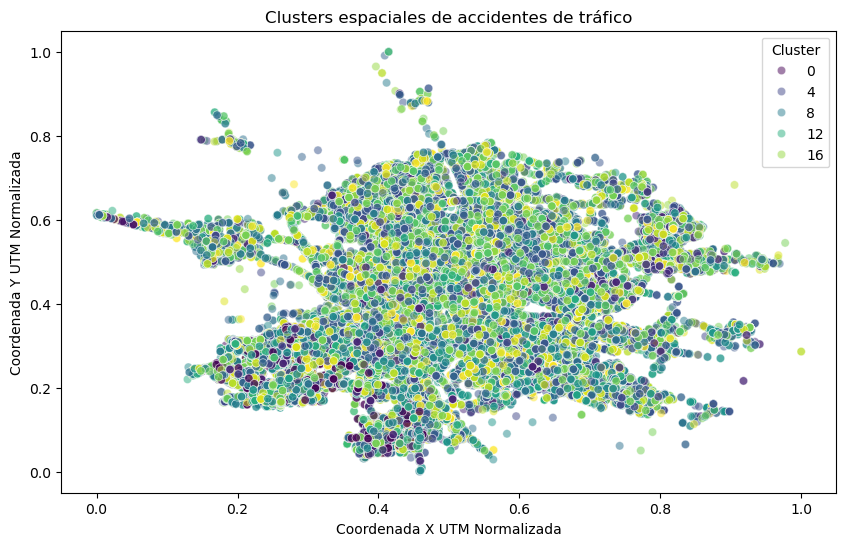

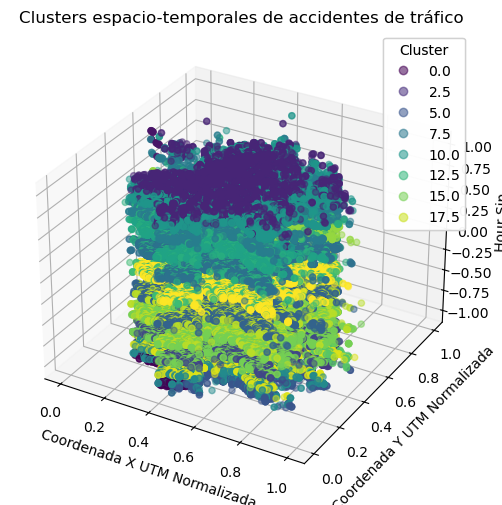

In [82]:
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar los datos
X = df[['coordenada_x_utm_norm', 'coordenada_y_utm_norm', 'hour_sin', 'hour_cos']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
'''
# 2. Seleccionar el número óptimo de clusters
n_components = np.arange(1, 10)
models = [GaussianMixture(n, covariance_type='full', random_state=42).fit(X_scaled) for n in n_components]

plt.figure(figsize=(8, 4))
plt.plot(n_components, [m.bic(X_scaled) for m in models], label='BIC')
plt.plot(n_components, [m.aic(X_scaled) for m in models], label='AIC')
plt.legend()
plt.xlabel('Número de componentes')
plt.ylabel('Puntaje')
plt.title('Selección del número óptimo de clusters')
plt.show()
'''
# 3. Entrenar el modelo GMM
gmm = GaussianMixture(n_components=20, covariance_type='full', random_state=42)
gmm.fit(X_scaled)

# 4. Predecir los clusters
df['cluster_esptemp'] = gmm.predict(X_scaled)

# 5. Análisis de lesividad en cada cluster
cluster_analysis = df.groupby('cluster_esptemp')['lesividad_binaria'].value_counts(normalize=True).unstack()
print(cluster_analysis)

# 6. Visualización espacial
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='coordenada_x_utm_norm', y='coordenada_y_utm_norm',
    hue='cluster_esptemp', palette='viridis', data=df, alpha=0.5
)
plt.title('Clusters espaciales de accidentes de tráfico')
plt.xlabel('Coordenada X UTM Normalizada')
plt.ylabel('Coordenada Y UTM Normalizada')
plt.legend(title='Cluster')
plt.show()

# 7. Visualización espacio-temporal
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    df['coordenada_x_utm_norm'], df['coordenada_y_utm_norm'], df['hour_sin'],
    c=df['cluster_esptemp'], cmap='viridis', alpha=0.5
)
ax.set_title('Clusters espacio-temporales de accidentes de tráfico')
ax.set_xlabel('Coordenada X UTM Normalizada')
ax.set_ylabel('Coordenada Y UTM Normalizada')
ax.set_zlabel('Hour Sin')
legend = ax.legend(*scatter.legend_elements(), title="Cluster")
ax.add_artist(legend)
plt.show()


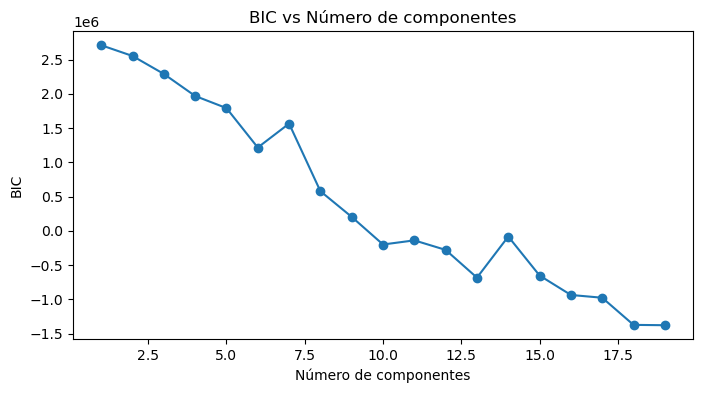

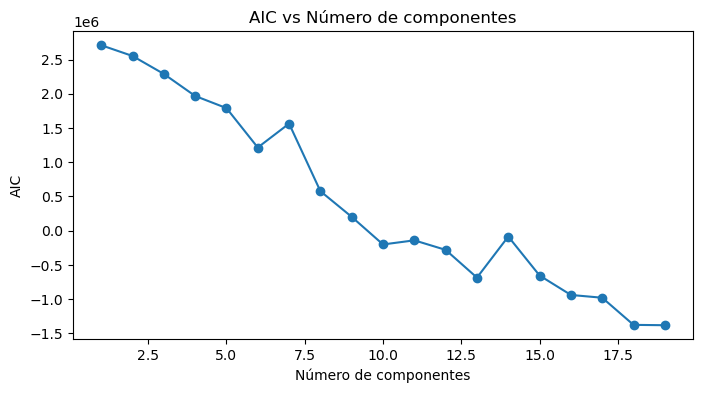

In [81]:
n_components = np.arange(1, 20)
models = [GaussianMixture(n, covariance_type='full', random_state=42).fit(X_scaled) for n in n_components]

# Gráfico de BIC
plt.figure(figsize=(8, 4))
plt.plot(n_components, [m.bic(X_scaled) for m in models], marker='o')
plt.xlabel('Número de componentes')
plt.ylabel('BIC')
plt.title('BIC vs Número de componentes')
plt.show()

# Gráfico de AIC
plt.figure(figsize=(8, 4))
plt.plot(n_components, [m.aic(X_scaled) for m in models], marker='o')
plt.xlabel('Número de componentes')
plt.ylabel('AIC')
plt.title('AIC vs Número de componentes')
plt.show()


POR LA NECESIDAD DE UN ALTO NÚMERO DE CLUSTERS Y LA NECESIDAD DE UNA DENSIDAD DETERMINADA; GMM NO SE USARA

DBSCAN

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Preparar y estandarizar los datos
X = df[['coordenada_x_utm_norm', 'coordenada_y_utm_norm', 'hour_sin', 'hour_cos']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. Definir los rangos de eps y min_samples
epsilon_values = np.linspace(0.001, 0.02, 20)
min_samples_values = [20, 30, 40, 50, 100]

# 3. Realizar la búsqueda exhaustiva y recopilar resultados
results = []

for min_samples in min_samples_values:
    for eps in epsilon_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(X_scaled)
        labels = dbscan.labels_
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_outliers = list(labels).count(-1)
        results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'n_outliers': n_outliers
        })

# 4. Crear un DataFrame con los resultados
results_df = pd.DataFrame(results)

# 5. Mostrar los resultados
print(results_df)

# 6. Visualizar los resultados
'''
# Heatmap para el número de clusters
clusters_pivot = results_df.pivot('eps', 'min_samples', 'n_clusters')
plt.figure(figsize=(8, 6))
sns.heatmap(clusters_pivot, annot=True, fmt=".0f", cmap='viridis')
plt.title('Número de Clusters en función de eps y min_samples')
plt.xlabel('min_samples')
plt.ylabel('eps')
plt.show()

# Heatmap para el número de outliers
outliers_pivot = results_df.pivot('eps', 'min_samples', 'n_outliers')
plt.figure(figsize=(8, 6))
sns.heatmap(outliers_pivot, annot=True, fmt=".0f", cmap='magma_r')
plt.title('Número de Outliers en función de eps y min_samples')
plt.xlabel('min_samples')
plt.ylabel('eps')
plt.show()
'''


      eps  min_samples  n_clusters  n_outliers
0   0.001            2       83246       16490
1   0.002            2       80309       15874
2   0.003            2       77765       15199
3   0.004            2       75375       14496
4   0.005            2       73127       13870
..    ...          ...         ...         ...
75  0.016            5       13280      112774
76  0.017            5       13354      108929
77  0.018            5       13434      105150
78  0.019            5       13563      101221
79  0.020            5       13610       97742

[80 rows x 4 columns]


'\n# Heatmap para el número de clusters\nclusters_pivot = results_df.pivot(\'eps\', \'min_samples\', \'n_clusters\')\nplt.figure(figsize=(8, 6))\nsns.heatmap(clusters_pivot, annot=True, fmt=".0f", cmap=\'viridis\')\nplt.title(\'Número de Clusters en función de eps y min_samples\')\nplt.xlabel(\'min_samples\')\nplt.ylabel(\'eps\')\nplt.show()\n\n# Heatmap para el número de outliers\noutliers_pivot = results_df.pivot(\'eps\', \'min_samples\', \'n_outliers\')\nplt.figure(figsize=(8, 6))\nsns.heatmap(outliers_pivot, annot=True, fmt=".0f", cmap=\'magma_r\')\nplt.title(\'Número de Outliers en función de eps y min_samples\')\nplt.xlabel(\'min_samples\')\nplt.ylabel(\'eps\')\nplt.show()\n'

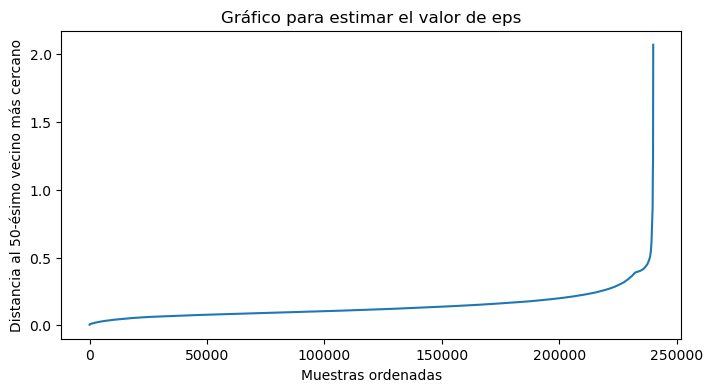

Número de clusters encontrados: 5
lesividad_binaria       0.0       1.0
cluster                              
0                  0.553986  0.446014
1                  0.519231  0.480769
2                  0.400000  0.600000
3                  0.333333  0.666667


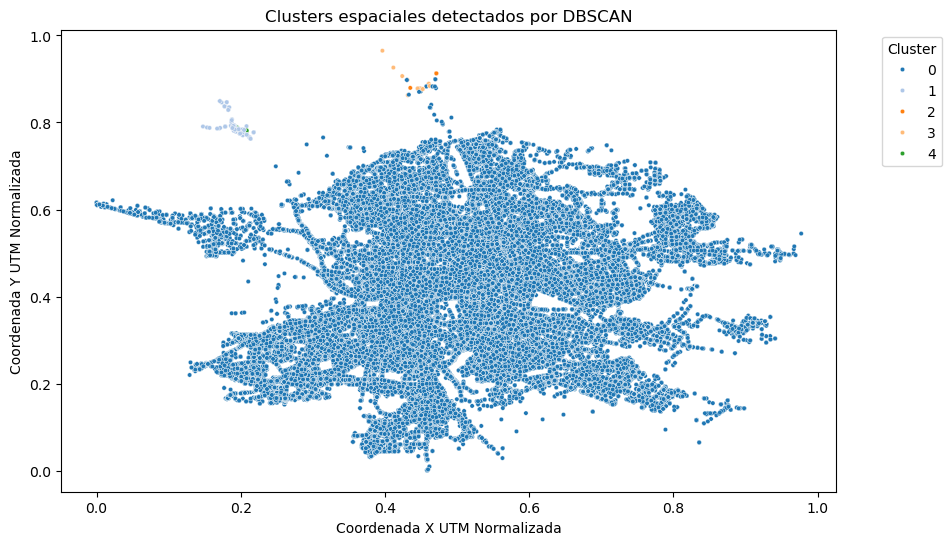

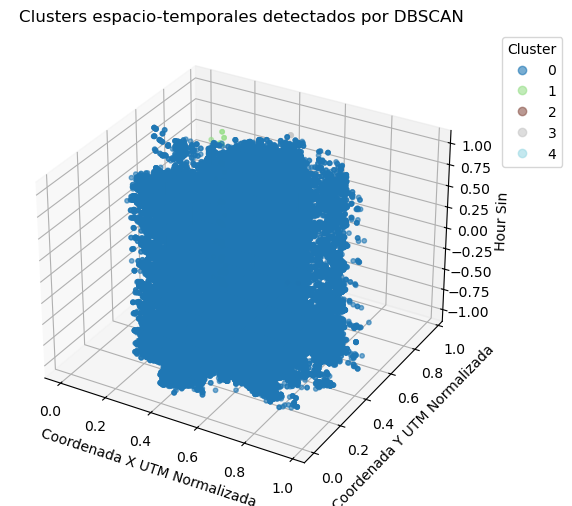

In [22]:

import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Preparar y estandarizar los datos
X = df[['coordenada_x_utm_norm', 'coordenada_y_utm_norm', 'hour_sin', 'hour_cos']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. Estimar el valor de eps
from sklearn.neighbors import NearestNeighbors
k = 50
nearest_neighbors = NearestNeighbors(n_neighbors=k)
neighbors = nearest_neighbors.fit(X_scaled)
distances, indices = neighbors.kneighbors(X_scaled)
distances = np.sort(distances[:, k-1], axis=0)

plt.figure(figsize=(8, 4))
plt.plot(distances)
plt.xlabel('Muestras ordenadas')
plt.ylabel(f'Distancia al {k}-ésimo vecino más cercano')
plt.title('Gráfico para estimar el valor de eps')
plt.show()

# 3. Aplicar DBSCAN
eps_value = 0.5  # Ajusta este valor según el gráfico anterior
dbscan = DBSCAN(eps=eps_value, min_samples=5)
dbscan.fit(X_scaled)
df['cluster'] = dbscan.labels_

# 4. Analizar los clusters
num_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
print(f"Número de clusters encontrados: {num_clusters}")

cluster_analysis = df[df['cluster'] != -1].groupby('cluster')['lesividad_binaria'].value_counts(normalize=True).unstack()
print(cluster_analysis)

# 5. Visualizar los clusters espaciales
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='coordenada_x_utm_norm',
    y='coordenada_y_utm_norm',
    hue='cluster',
    palette='tab20',
    data=df[df['cluster'] != -1],
    s=10,
    legend='full'
)
plt.title('Clusters espaciales detectados por DBSCAN')
plt.xlabel('Coordenada X UTM Normalizada')
plt.ylabel('Coordenada Y UTM Normalizada')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

# 6. Visualización espacio-temporal
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    df[df['cluster'] != -1]['coordenada_x_utm_norm'],
    df[df['cluster'] != -1]['coordenada_y_utm_norm'],
    df[df['cluster'] != -1]['hour_sin'],
    c=df[df['cluster'] != -1]['cluster'],
    cmap='tab20',
    s=10,
    alpha=0.6
)
ax.set_title('Clusters espacio-temporales detectados por DBSCAN')
ax.set_xlabel('Coordenada X UTM Normalizada')
ax.set_ylabel('Coordenada Y UTM Normalizada')
ax.set_zlabel('Hour Sin')
plt.legend(*scatter.legend_elements(), title="Cluster", bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

